In [1]:
import numpy as np
import math
import torch
from torch import nn

import scipy.stats as stats
import matplotlib
import matplotlib.pyplot as plt
from livelossplot import PlotLosses
from Inference.GeNVI_PACPred_method import GeNPACPred, GeNetEns

In [2]:
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda', index=0)

In [3]:
from Experiments.foong import Setup
setup=Setup(device, layerwidth=50)

# Target density #

In [4]:
loss= setup.loss
projection=setup.projection
logprior=setup.logprior
n_data_samples=setup.n_samples
param_count=setup.param_count
model=setup._model
print(n_data_samples)

200


# Generative Network #

In [10]:
activation = nn.Tanh()#nn.ReLU()
init_b = .001
lat_dim=10
GeN = GeNetEns(1, lat_dim, 50, param_count, activation, 0.2, init_b, device)

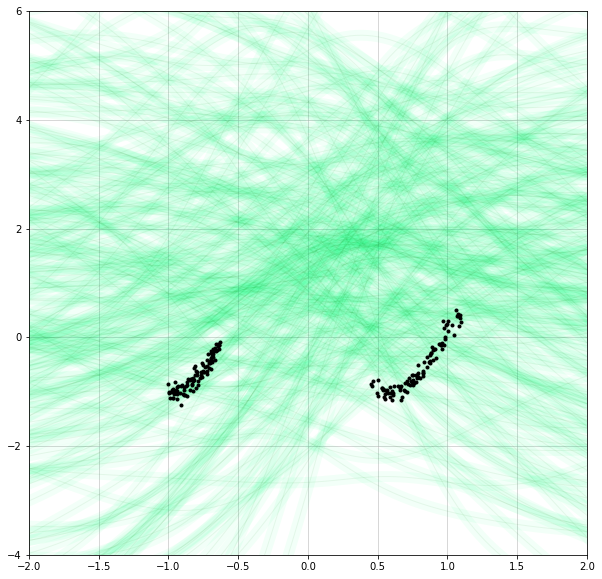

Epoch [0/20000], Bound: 1.5593725442886353, Entropy: -147.4805450439453, Temp: 1.0, KL: 692.9573364257812, Loss: 0.751819372177124, Learning Rate: 0.03
Epoch [1/20000], Bound: 1.5761772394180298, Entropy: -127.88204956054688, Temp: 1.0063328742980957, KL: 2243.951416015625, Loss: 0.8553518652915955, Learning Rate: 0.03
Epoch [2/20000], Bound: 1.5559483766555786, Entropy: -131.06365966796875, Temp: 1.0119988918304443, KL: 776.8267211914062, Loss: 0.7188535928726196, Learning Rate: 0.03
Epoch [3/20000], Bound: 1.5514600276947021, Entropy: -158.2488250732422, Temp: 1.0179734230041504, KL: 774.4852905273438, Loss: 0.778790295124054, Learning Rate: 0.03
Epoch [4/20000], Bound: 1.544601321220398, Entropy: -158.9786834716797, Temp: 1.0239231586456299, KL: 743.4742431640625, Loss: 0.8174055814743042, Learning Rate: 0.03
Epoch [5/20000], Bound: 1.4799625873565674, Entropy: -162.44122314453125, Temp: 1.0294378995895386, KL: 490.7130432128906, Loss: 0.5216420292854309, Learning Rate: 0.03
Epoch [

Epoch [50/20000], Bound: 1.2680137157440186, Entropy: -192.452392578125, Temp: 1.2425817251205444, KL: 358.6236572265625, Loss: 0.40089860558509827, Learning Rate: 0.03
Epoch [51/20000], Bound: 1.2737849950790405, Entropy: -186.95654296875, Temp: 1.2461374998092651, KL: 367.177978515625, Loss: 0.4110132157802582, Learning Rate: 0.03
Epoch [52/20000], Bound: 1.2709095478057861, Entropy: -183.3181610107422, Temp: 1.2497508525848389, KL: 359.9269714355469, Loss: 0.4325501024723053, Learning Rate: 0.03
Epoch [53/20000], Bound: 1.2717777490615845, Entropy: -181.11331176757812, Temp: 1.2532047033309937, KL: 373.0704345703125, Loss: 0.39512601494789124, Learning Rate: 0.03
Epoch [54/20000], Bound: 1.268643856048584, Entropy: -177.4774169921875, Temp: 1.256828784942627, KL: 358.6730041503906, Loss: 0.4432259798049927, Learning Rate: 0.03
Epoch [55/20000], Bound: 1.2921725511550903, Entropy: -185.12464904785156, Temp: 1.260157823562622, KL: 380.90234375, Loss: 0.526479959487915, Learning Rate: 

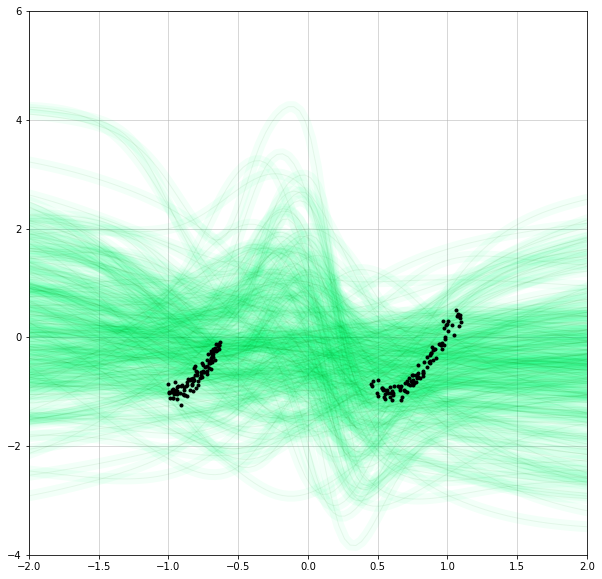

Epoch [100/20000], Bound: 1.187821626663208, Entropy: -182.3643035888672, Temp: 1.3919086456298828, KL: 336.16778564453125, Loss: 0.3721531331539154, Learning Rate: 0.03
Epoch [101/20000], Bound: 1.1660807132720947, Entropy: -186.8312530517578, Temp: 1.3931690454483032, KL: 332.2711486816406, Loss: 0.2863513231277466, Learning Rate: 0.03
Epoch [102/20000], Bound: 1.1772748231887817, Entropy: -184.26260375976562, Temp: 1.3948345184326172, KL: 335.5491027832031, Loss: 0.32791444659233093, Learning Rate: 0.03
Epoch [103/20000], Bound: 1.1775790452957153, Entropy: -195.9527587890625, Temp: 1.3964457511901855, KL: 346.64923095703125, Loss: 0.2921740710735321, Learning Rate: 0.03
Epoch [104/20000], Bound: 1.1703060865402222, Entropy: -192.6512451171875, Temp: 1.3984242677688599, KL: 337.8602600097656, Loss: 0.2930459678173065, Learning Rate: 0.03
Epoch [105/20000], Bound: 1.1889840364456177, Entropy: -186.33518981933594, Temp: 1.4006730318069458, KL: 350.3472900390625, Loss: 0.34252071380615

Epoch [149/20000], Bound: 1.1271424293518066, Entropy: -173.01161193847656, Temp: 1.48635733127594, KL: 335.109130859375, Loss: 0.23544920980930328, Learning Rate: 0.03
Epoch [150/20000], Bound: 1.110783338546753, Entropy: -181.58871459960938, Temp: 1.4897178411483765, KL: 330.73095703125, Loss: 0.19025905430316925, Learning Rate: 0.03
Epoch [151/20000], Bound: 1.1122127771377563, Entropy: -184.76458740234375, Temp: 1.4939228296279907, KL: 317.17047119140625, Loss: 0.24554136395454407, Learning Rate: 0.03
Epoch [152/20000], Bound: 1.1233631372451782, Entropy: -183.90048217773438, Temp: 1.4981210231781006, KL: 325.02496337890625, Loss: 0.26750290393829346, Learning Rate: 0.03
Epoch [153/20000], Bound: 1.111746072769165, Entropy: -182.65606689453125, Temp: 1.5020623207092285, KL: 327.3154296875, Loss: 0.2185351848602295, Learning Rate: 0.03
Epoch [154/20000], Bound: 1.107619285583496, Entropy: -186.0280303955078, Temp: 1.506369948387146, KL: 326.1844787597656, Loss: 0.21124805510044098, 

Epoch [199/20000], Bound: 1.0306340456008911, Entropy: -180.83079528808594, Temp: 1.7601282596588135, KL: 314.6552429199219, Loss: 0.17878352105617523, Learning Rate: 0.03


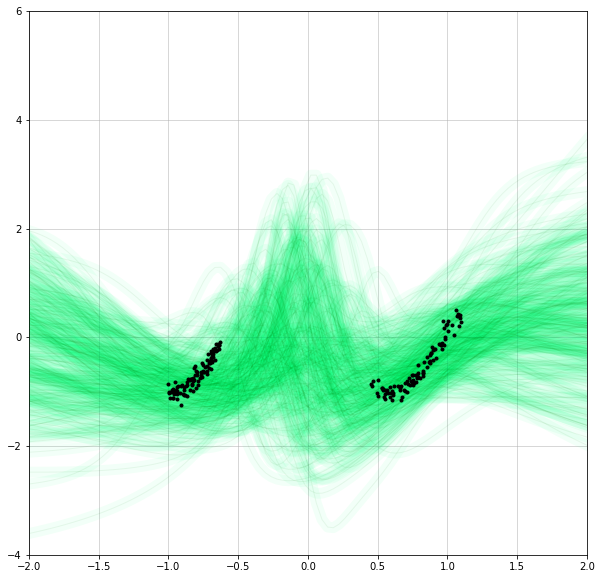

Epoch [200/20000], Bound: 1.0294415950775146, Entropy: -183.16786193847656, Temp: 1.7646348476409912, KL: 323.7843017578125, Loss: 0.1517227739095688, Learning Rate: 0.03
Epoch [201/20000], Bound: 1.027076005935669, Entropy: -190.3153076171875, Temp: 1.7691984176635742, KL: 319.5999755859375, Loss: 0.15871058404445648, Learning Rate: 0.03
Epoch [202/20000], Bound: 1.0385255813598633, Entropy: -186.99114990234375, Temp: 1.773669958114624, KL: 318.53466796875, Loss: 0.20193040370941162, Learning Rate: 0.03
Epoch [203/20000], Bound: 1.0500600337982178, Entropy: -182.6348114013672, Temp: 1.7773669958114624, KL: 332.6650695800781, Loss: 0.205205038189888, Learning Rate: 0.03
Epoch [204/20000], Bound: 1.0148524045944214, Entropy: -183.3265838623047, Temp: 1.7803653478622437, KL: 316.5904235839844, Loss: 0.13581307232379913, Learning Rate: 0.03
Epoch [205/20000], Bound: 1.0397473573684692, Entropy: -191.4307861328125, Temp: 1.7837241888046265, KL: 317.0023193359375, Loss: 0.21651826798915863,

Epoch [250/20000], Bound: 0.9802793264389038, Entropy: -179.88230895996094, Temp: 1.8921608924865723, KL: 313.314453125, Loss: 0.09964677691459656, Learning Rate: 0.03
Epoch [251/20000], Bound: 0.9834873080253601, Entropy: -184.18540954589844, Temp: 1.8965399265289307, KL: 316.7156982421875, Loss: 0.10117404907941818, Learning Rate: 0.03
Epoch [252/20000], Bound: 0.9887194633483887, Entropy: -179.69918823242188, Temp: 1.9013621807098389, KL: 317.27166748046875, Loss: 0.11625882983207703, Learning Rate: 0.03
Epoch [253/20000], Bound: 0.9874899387359619, Entropy: -182.58953857421875, Temp: 1.906303882598877, KL: 320.126220703125, Loss: 0.10741937160491943, Learning Rate: 0.03
Epoch [254/20000], Bound: 0.9807689189910889, Entropy: -182.7742156982422, Temp: 1.9115056991577148, KL: 319.546875, Loss: 0.09258130937814713, Learning Rate: 0.03
Epoch [255/20000], Bound: 0.9909915924072266, Entropy: -188.0780029296875, Temp: 1.9171851873397827, KL: 315.8811340332031, Loss: 0.1330828070640564, Lea

Epoch [299/20000], Bound: 0.9577782154083252, Entropy: -160.70077514648438, Temp: 2.027181625366211, KL: 305.9877624511719, Loss: 0.10851481556892395, Learning Rate: 0.03


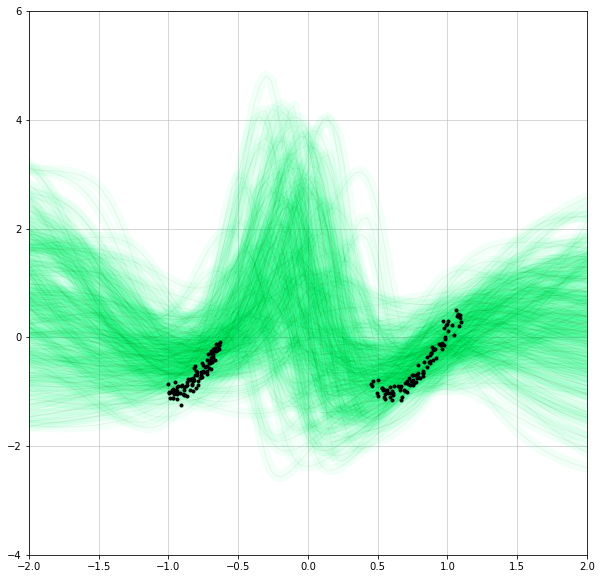

Epoch [300/20000], Bound: 0.9732110500335693, Entropy: -161.98355102539062, Temp: 2.028373956680298, KL: 306.6206970214844, Loss: 0.1482648104429245, Learning Rate: 0.03
Epoch [301/20000], Bound: 0.9692705273628235, Entropy: -169.12489318847656, Temp: 2.028951644897461, KL: 300.5374755859375, Loss: 0.15266691148281097, Learning Rate: 0.03
Epoch [302/20000], Bound: 0.959805428981781, Entropy: -177.3978729248047, Temp: 2.0288569927215576, KL: 309.16314697265625, Loss: 0.10640642046928406, Learning Rate: 0.03
Epoch [303/20000], Bound: 0.9843097925186157, Entropy: -176.09829711914062, Temp: 2.0291097164154053, KL: 319.403564453125, Loss: 0.14871573448181152, Learning Rate: 0.03
Epoch [304/20000], Bound: 0.9610397219657898, Entropy: -173.97177124023438, Temp: 2.0288877487182617, KL: 312.6839294433594, Loss: 0.10092536360025406, Learning Rate: 0.03
Epoch [305/20000], Bound: 0.9560839533805847, Entropy: -174.73779296875, Temp: 2.0291519165039062, KL: 307.11798095703125, Loss: 0.10205716639757

Epoch [351/20000], Bound: 0.9475153684616089, Entropy: -167.41635131835938, Temp: 2.121391534805298, KL: 306.9632568359375, Loss: 0.10790539532899857, Learning Rate: 0.03
Epoch [352/20000], Bound: 0.9429190158843994, Entropy: -161.85360717773438, Temp: 2.1220128536224365, KL: 295.69256591796875, Loss: 0.12328236550092697, Learning Rate: 0.03
Epoch [353/20000], Bound: 0.9386809468269348, Entropy: -177.61077880859375, Temp: 2.122199535369873, KL: 310.94927978515625, Loss: 0.07715676724910736, Learning Rate: 0.03
Epoch [354/20000], Bound: 0.9304429292678833, Entropy: -169.56332397460938, Temp: 2.12307071685791, KL: 303.2381591796875, Loss: 0.07627875357866287, Learning Rate: 0.03
Epoch [355/20000], Bound: 0.9204559922218323, Entropy: -159.665283203125, Temp: 2.1245434284210205, KL: 301.89892578125, Loss: 0.05744236707687378, Learning Rate: 0.03
Epoch [356/20000], Bound: 0.9202489256858826, Entropy: -154.91717529296875, Temp: 2.1269655227661133, KL: 296.8644714355469, Loss: 0.0694195479154

Epoch [399/20000], Bound: 0.9387193918228149, Entropy: -151.44720458984375, Temp: 2.194936513900757, KL: 304.9435119628906, Loss: 0.10954049229621887, Learning Rate: 0.03


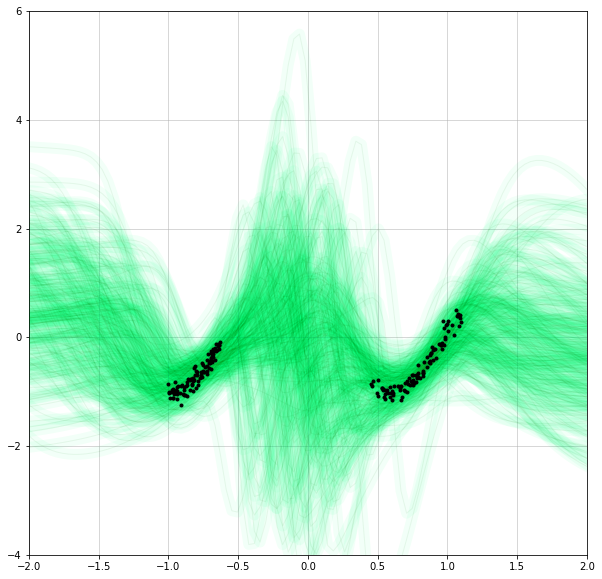

Epoch [400/20000], Bound: 0.9022055268287659, Entropy: -155.779052734375, Temp: 2.1976828575134277, KL: 293.6396789550781, Loss: 0.05443557724356651, Learning Rate: 0.03
Epoch [401/20000], Bound: 0.9326812624931335, Entropy: -160.61428833007812, Temp: 2.201122760772705, KL: 298.45751953125, Loss: 0.11120133846998215, Learning Rate: 0.03
Epoch [402/20000], Bound: 0.9098561406135559, Entropy: -159.44442749023438, Temp: 2.203878164291382, KL: 293.71673583984375, Loss: 0.07145097851753235, Learning Rate: 0.03
Epoch [403/20000], Bound: 0.9367730617523193, Entropy: -160.41305541992188, Temp: 2.206911087036133, KL: 300.650634765625, Loss: 0.11734111607074738, Learning Rate: 0.03
Epoch [404/20000], Bound: 0.9034783840179443, Entropy: -155.22972106933594, Temp: 2.2091503143310547, KL: 293.8623962402344, Loss: 0.05888146162033081, Learning Rate: 0.03
Epoch [405/20000], Bound: 0.9196772575378418, Entropy: -152.61114501953125, Temp: 2.2120025157928467, KL: 292.384521484375, Loss: 0.097463548183441

Epoch [448/20000], Bound: 0.8817576169967651, Entropy: -153.71595764160156, Temp: 2.40747332572937, KL: 299.098876953125, Loss: 0.03910031542181969, Learning Rate: 0.03
Epoch [449/20000], Bound: 0.8806119561195374, Entropy: -158.4227752685547, Temp: 2.413308620452881, KL: 297.1829833984375, Loss: 0.04175874963402748, Learning Rate: 0.03
Epoch [450/20000], Bound: 0.8732105493545532, Entropy: -155.0578155517578, Temp: 2.4193789958953857, KL: 295.94659423828125, Loss: 0.03134589269757271, Learning Rate: 0.03
Epoch [451/20000], Bound: 0.8836197853088379, Entropy: -160.9716796875, Temp: 2.4259111881256104, KL: 296.6980285644531, Loss: 0.050370387732982635, Learning Rate: 0.03
Epoch [452/20000], Bound: 0.8783058524131775, Entropy: -140.52792358398438, Temp: 2.4323601722717285, KL: 291.81597900390625, Loss: 0.05118868872523308, Learning Rate: 0.03
Epoch [453/20000], Bound: 0.8799603581428528, Entropy: -151.05052185058594, Temp: 2.4386816024780273, KL: 294.05712890625, Loss: 0.0505984947085380

Epoch [496/20000], Bound: 0.8622298240661621, Entropy: -139.88294982910156, Temp: 2.55993390083313, KL: 288.6422119140625, Loss: 0.04399854689836502, Learning Rate: 0.03
Epoch [497/20000], Bound: 0.8600660562515259, Entropy: -150.11007690429688, Temp: 2.562633514404297, KL: 287.7310791015625, Loss: 0.042276374995708466, Learning Rate: 0.03
Epoch [498/20000], Bound: 0.8737385869026184, Entropy: -148.5117950439453, Temp: 2.565558671951294, KL: 295.02215576171875, Loss: 0.053022582083940506, Learning Rate: 0.03
Epoch [499/20000], Bound: 0.8639804720878601, Entropy: -155.19183349609375, Temp: 2.568406581878662, KL: 290.5042724609375, Loss: 0.04440039023756981, Learning Rate: 0.03


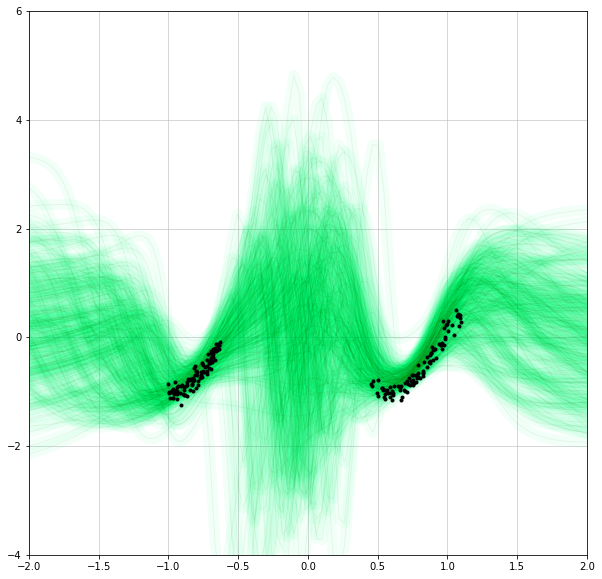

Epoch [500/20000], Bound: 0.8661836981773376, Entropy: -151.7205352783203, Temp: 2.5714049339294434, KL: 291.0466613769531, Loss: 0.047611720860004425, Learning Rate: 0.03
Epoch [501/20000], Bound: 0.8703015446662903, Entropy: -145.21121215820312, Temp: 2.5744454860687256, KL: 289.4814758300781, Loss: 0.058452095836400986, Learning Rate: 0.03
Epoch [502/20000], Bound: 0.8720508217811584, Entropy: -164.10243225097656, Temp: 2.577209234237671, KL: 303.71356201171875, Loss: 0.0343562550842762, Learning Rate: 0.03
Epoch [503/20000], Bound: 0.8803826570510864, Entropy: -155.19656372070312, Temp: 2.5804412364959717, KL: 296.9460754394531, Loss: 0.0635499358177185, Learning Rate: 0.03
Epoch [504/20000], Bound: 0.8832032680511475, Entropy: -140.28079223632812, Temp: 2.5832502841949463, KL: 292.1690673828125, Loss: 0.07857789844274521, Learning Rate: 0.03
Epoch [505/20000], Bound: 0.8517591953277588, Entropy: -140.80889892578125, Temp: 2.5852365493774414, KL: 287.03558349609375, Loss: 0.0317977

Epoch [551/20000], Bound: 0.8620408177375793, Entropy: -159.95767211914062, Temp: 2.6317641735076904, KL: 299.6169738769531, Loss: 0.030299820005893707, Learning Rate: 0.03
Epoch [552/20000], Bound: 0.8738780617713928, Entropy: -146.11801147460938, Temp: 2.6327452659606934, KL: 293.3420104980469, Loss: 0.0637892410159111, Learning Rate: 0.03
Epoch [553/20000], Bound: 0.8595093488693237, Entropy: -140.3334503173828, Temp: 2.633392333984375, KL: 287.3058166503906, Loss: 0.04940995201468468, Learning Rate: 0.03
Epoch [554/20000], Bound: 0.8746799230575562, Entropy: -140.8802490234375, Temp: 2.634140968322754, KL: 291.4847106933594, Loss: 0.06895624101161957, Learning Rate: 0.03
Epoch [555/20000], Bound: 0.8745189905166626, Entropy: -159.12594604492188, Temp: 2.634415864944458, KL: 295.0191650390625, Loss: 0.06197434291243553, Learning Rate: 0.03
Epoch [556/20000], Bound: 0.8536473512649536, Entropy: -154.32191467285156, Temp: 2.6344821453094482, KL: 292.1723937988281, Loss: 0.030197858810

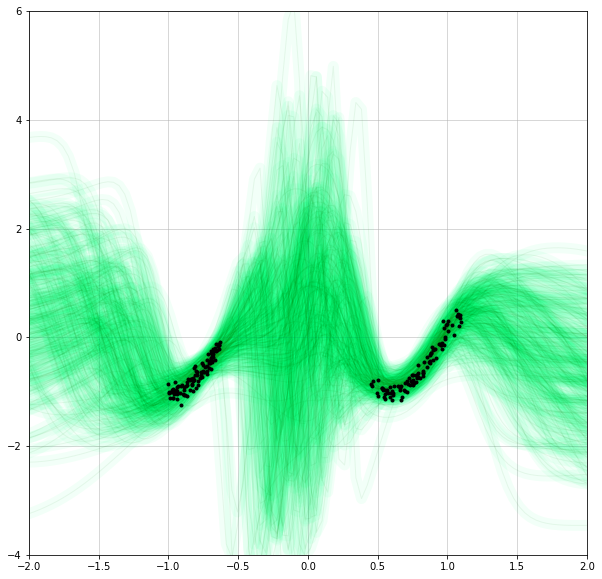

Epoch [600/20000], Bound: 0.8460477590560913, Entropy: -145.18734741210938, Temp: 2.6816351413726807, KL: 284.0832824707031, Loss: 0.03717835992574692, Learning Rate: 0.03
Epoch [601/20000], Bound: 0.8469408750534058, Entropy: -144.92495727539062, Temp: 2.685972213745117, KL: 288.39056396484375, Loss: 0.031007936224341393, Learning Rate: 0.03
Epoch [602/20000], Bound: 0.8448390364646912, Entropy: -136.79421997070312, Temp: 2.6905336380004883, KL: 286.2345886230469, Loss: 0.03198237717151642, Learning Rate: 0.03
Epoch [603/20000], Bound: 0.845231831073761, Entropy: -146.7015838623047, Temp: 2.6952521800994873, KL: 288.92138671875, Loss: 0.02805452048778534, Learning Rate: 0.03
Epoch [604/20000], Bound: 0.8368722200393677, Entropy: -139.26324462890625, Temp: 2.7002365589141846, KL: 284.1019287109375, Loss: 0.02401834912598133, Learning Rate: 0.03
Epoch [605/20000], Bound: 0.8476085662841797, Entropy: -141.16380310058594, Temp: 2.7055656909942627, KL: 285.0538635253906, Loss: 0.0400189645

Epoch [648/20000], Bound: 0.8355491161346436, Entropy: -135.6420440673828, Temp: 2.7631375789642334, KL: 283.009765625, Loss: 0.029076581820845604, Learning Rate: 0.03
Epoch [649/20000], Bound: 0.8439508080482483, Entropy: -143.657958984375, Temp: 2.7643682956695557, KL: 287.66168212890625, Loss: 0.03411824256181717, Learning Rate: 0.03
Epoch [650/20000], Bound: 0.8460403680801392, Entropy: -129.8975830078125, Temp: 2.765906572341919, KL: 280.7386474609375, Loss: 0.050156306475400925, Learning Rate: 0.03
Epoch [651/20000], Bound: 0.8346239328384399, Entropy: -131.12957763671875, Temp: 2.7671656608581543, KL: 281.3196105957031, Loss: 0.03099953383207321, Learning Rate: 0.03
Epoch [652/20000], Bound: 0.8433632254600525, Entropy: -135.3914794921875, Temp: 2.768808603286743, KL: 289.61444091796875, Loss: 0.02999371849000454, Learning Rate: 0.03
Epoch [653/20000], Bound: 0.8396216630935669, Entropy: -136.12069702148438, Temp: 2.770854949951172, KL: 287.1736755371094, Loss: 0.028568489477038

Epoch [696/20000], Bound: 0.8363399505615234, Entropy: -130.85910034179688, Temp: 2.8135647773742676, KL: 284.38116455078125, Loss: 0.03162004053592682, Learning Rate: 0.03
Epoch [697/20000], Bound: 0.8345257043838501, Entropy: -140.46856689453125, Temp: 2.8135876655578613, KL: 281.3211669921875, Loss: 0.03423624485731125, Learning Rate: 0.03
Epoch [698/20000], Bound: 0.8406765460968018, Entropy: -150.02163696289062, Temp: 2.8139407634735107, KL: 284.8931884765625, Loss: 0.03757829591631889, Learning Rate: 0.03
Epoch [699/20000], Bound: 0.8399315476417542, Entropy: -148.79263305664062, Temp: 2.8144874572753906, KL: 284.07354736328125, Loss: 0.037889257073402405, Learning Rate: 0.03


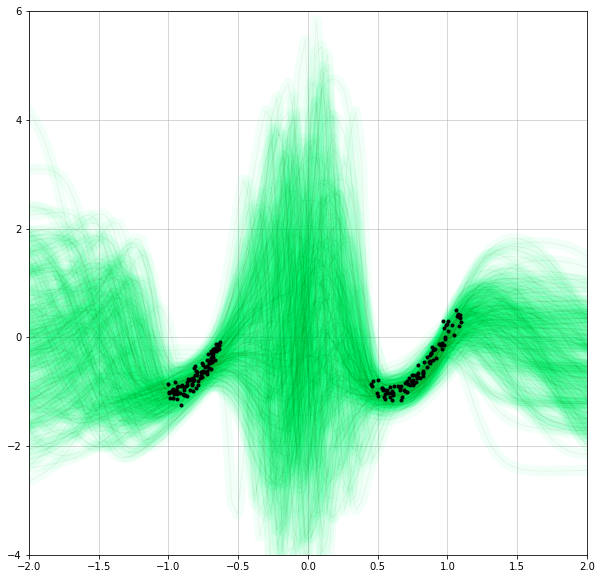

Epoch [700/20000], Bound: 0.8352442383766174, Entropy: -138.9320831298828, Temp: 2.8151941299438477, KL: 284.06744384765625, Loss: 0.030587034299969673, Learning Rate: 0.03
Epoch [701/20000], Bound: 0.8421946167945862, Entropy: -147.2685546875, Temp: 2.8162972927093506, KL: 286.71014404296875, Loss: 0.03694801405072212, Learning Rate: 0.03
Epoch [702/20000], Bound: 0.8580371737480164, Entropy: -131.81707763671875, Temp: 2.817544460296631, KL: 281.31707763671875, Loss: 0.07296591252088547, Learning Rate: 0.03
Epoch [703/20000], Bound: 0.8448287844657898, Entropy: -133.6994171142578, Temp: 2.817667245864868, KL: 283.50079345703125, Loss: 0.04699157550930977, Learning Rate: 0.03
Epoch [704/20000], Bound: 0.8438605666160583, Entropy: -142.94915771484375, Temp: 2.8176705837249756, KL: 289.5085754394531, Loss: 0.034763239324092865, Learning Rate: 0.03
Epoch [705/20000], Bound: 0.8672565221786499, Entropy: -135.36827087402344, Temp: 2.818009614944458, KL: 288.2432861328125, Loss: 0.0769982784

Epoch [750/20000], Bound: 0.8391458988189697, Entropy: -149.25689697265625, Temp: 2.894678831100464, KL: 284.93121337890625, Loss: 0.04054763540625572, Learning Rate: 0.03
Epoch [751/20000], Bound: 0.8116093277931213, Entropy: -126.74217224121094, Temp: 2.898669719696045, KL: 272.6868896484375, Loss: 0.02108933962881565, Learning Rate: 0.03
Epoch [752/20000], Bound: 0.824201226234436, Entropy: -129.67591857910156, Temp: 2.9029195308685303, KL: 275.8114013671875, Loss: 0.034024178981781006, Learning Rate: 0.03
Epoch [753/20000], Bound: 0.8334463834762573, Entropy: -140.06448364257812, Temp: 2.9069314002990723, KL: 279.94921875, Loss: 0.04103340953588486, Learning Rate: 0.03
Epoch [754/20000], Bound: 0.8237719535827637, Entropy: -133.90673828125, Temp: 2.9104819297790527, KL: 277.9508056640625, Loss: 0.03015906922519207, Learning Rate: 0.03
Epoch [755/20000], Bound: 0.8364948034286499, Entropy: -131.15020751953125, Temp: 2.9140002727508545, KL: 279.6331787109375, Loss: 0.0466993786394596

Epoch [799/20000], Bound: 0.8124188780784607, Entropy: -129.99575805664062, Temp: 3.0705618858337402, KL: 281.54998779296875, Loss: 0.01660953089594841, Learning Rate: 0.03


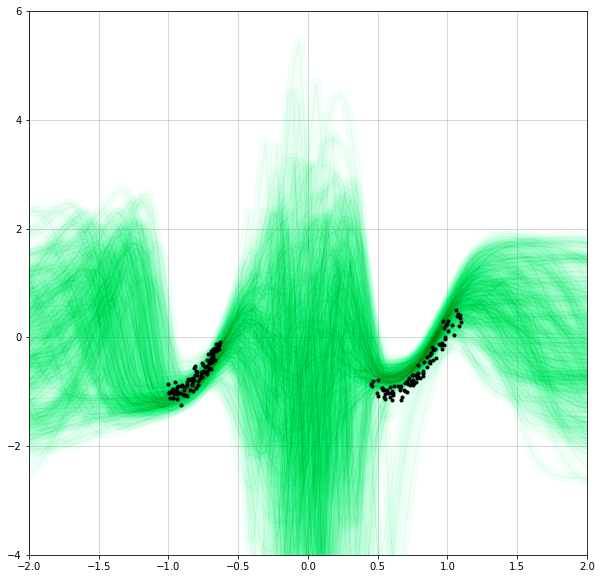

Epoch [800/20000], Bound: 0.8251873254776001, Entropy: -127.88459777832031, Temp: 3.074906587600708, KL: 276.56536865234375, Loss: 0.04301544278860092, Learning Rate: 0.03
Epoch [801/20000], Bound: 0.840137243270874, Entropy: -128.26568603515625, Temp: 3.078403949737549, KL: 285.18743896484375, Loss: 0.05170045793056488, Learning Rate: 0.03
Epoch [802/20000], Bound: 0.8241556286811829, Entropy: -118.41207885742188, Temp: 3.080831289291382, KL: 276.2738037109375, Loss: 0.042250726372003555, Learning Rate: 0.03
Epoch [803/20000], Bound: 0.8100239634513855, Entropy: -140.29116821289062, Temp: 3.082620620727539, KL: 274.52783203125, Loss: 0.025305135175585747, Learning Rate: 0.03
Epoch [804/20000], Bound: 0.8219136595726013, Entropy: -132.63735961914062, Temp: 3.0844831466674805, KL: 276.7916259765625, Loss: 0.038339003920555115, Learning Rate: 0.03
Epoch [805/20000], Bound: 0.8196908831596375, Entropy: -127.92945861816406, Temp: 3.085909605026245, KL: 276.97320556640625, Loss: 0.034935444

Epoch [849/20000], Bound: 0.810516357421875, Entropy: -119.42024230957031, Temp: 3.0172107219696045, KL: 273.1033935546875, Loss: 0.02524816244840622, Learning Rate: 0.03
Epoch [850/20000], Bound: 0.8223949074745178, Entropy: -124.28839111328125, Temp: 3.0160930156707764, KL: 276.96087646484375, Loss: 0.035556670278310776, Learning Rate: 0.03
Epoch [851/20000], Bound: 0.8160645365715027, Entropy: -123.03857421875, Temp: 3.015040636062622, KL: 275.7878112792969, Loss: 0.028412779793143272, Learning Rate: 0.03
Epoch [852/20000], Bound: 0.8164429068565369, Entropy: -132.92245483398438, Temp: 3.0143299102783203, KL: 273.126220703125, Loss: 0.033325549215078354, Learning Rate: 0.03
Epoch [853/20000], Bound: 0.8147757053375244, Entropy: -132.5251922607422, Temp: 3.013723373413086, KL: 277.78631591796875, Loss: 0.02322099171578884, Learning Rate: 0.03
Epoch [854/20000], Bound: 0.8158990740776062, Entropy: -120.62286376953125, Temp: 3.013631820678711, KL: 274.8505859375, Loss: 0.02966443635523

Epoch [897/20000], Bound: 0.8223118185997009, Entropy: -134.56427001953125, Temp: 2.8867387771606445, KL: 276.5531921386719, Loss: 0.0290000569075346, Learning Rate: 0.015
Epoch [898/20000], Bound: 0.8072856068611145, Entropy: -127.48979187011719, Temp: 2.888489246368408, KL: 271.26849365234375, Loss: 0.016940176486968994, Learning Rate: 0.015
Epoch [899/20000], Bound: 0.823092520236969, Entropy: -133.263671875, Temp: 2.8905105590820312, KL: 282.109375, Loss: 0.020762428641319275, Learning Rate: 0.015


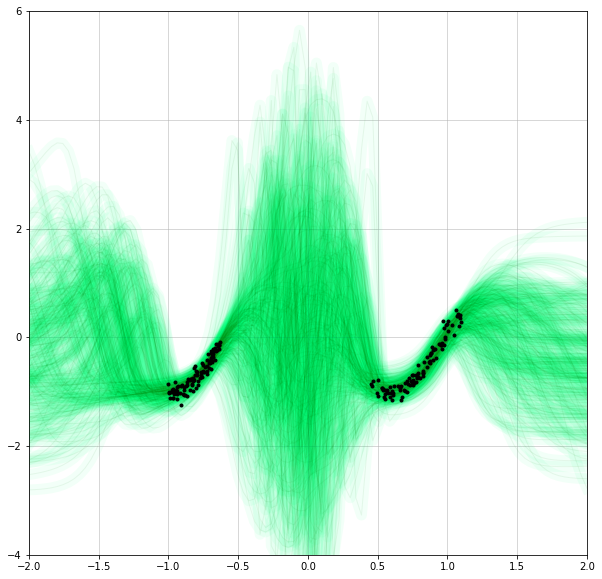

Epoch [900/20000], Bound: 0.8103557229042053, Entropy: -121.14617919921875, Temp: 2.892714738845825, KL: 273.6451416015625, Loss: 0.017331060022115707, Learning Rate: 0.015
Epoch [901/20000], Bound: 0.8037896752357483, Entropy: -117.4130859375, Temp: 2.895137071609497, KL: 268.2217102050781, Loss: 0.017823221161961555, Learning Rate: 0.015
Epoch [902/20000], Bound: 0.8143563866615295, Entropy: -131.32684326171875, Temp: 2.897735357284546, KL: 274.8841247558594, Loss: 0.02110641449689865, Learning Rate: 0.015
Epoch [903/20000], Bound: 0.821347713470459, Entropy: -133.24349975585938, Temp: 2.900434970855713, KL: 277.6788024902344, Loss: 0.02647976391017437, Learning Rate: 0.015
Epoch [904/20000], Bound: 0.8118600845336914, Entropy: -125.79986572265625, Temp: 2.90312123298645, KL: 274.75823974609375, Loss: 0.018133820965886116, Learning Rate: 0.015
Epoch [905/20000], Bound: 0.8130614161491394, Entropy: -128.3828887939453, Temp: 2.9059555530548096, KL: 277.71661376953125, Loss: 0.014897016

Epoch [948/20000], Bound: 0.7993826270103455, Entropy: -125.30618286132812, Temp: 3.0702965259552, KL: 273.6195068359375, Loss: 0.012017262168228626, Learning Rate: 0.015
Epoch [949/20000], Bound: 0.8000931143760681, Entropy: -131.40052795410156, Temp: 3.0740807056427, KL: 273.6197509765625, Loss: 0.01312304101884365, Learning Rate: 0.015
Epoch [950/20000], Bound: 0.7965232729911804, Entropy: -122.2274169921875, Temp: 3.077878713607788, KL: 270.5513916015625, Loss: 0.013643856160342693, Learning Rate: 0.015
Epoch [951/20000], Bound: 0.8005287051200867, Entropy: -128.5692138671875, Temp: 3.0816714763641357, KL: 272.49871826171875, Loss: 0.01586344838142395, Learning Rate: 0.015
Epoch [952/20000], Bound: 0.8085389733314514, Entropy: -129.56134033203125, Temp: 3.085413694381714, KL: 279.64434814453125, Loss: 0.015121547505259514, Learning Rate: 0.015
Epoch [953/20000], Bound: 0.7991295456886292, Entropy: -127.51750183105469, Temp: 3.089132785797119, KL: 273.5943603515625, Loss: 0.01259900

Epoch [997/20000], Bound: 0.7943919897079468, Entropy: -118.63873291015625, Temp: 3.228976249694824, KL: 270.6201477050781, Loss: 0.01691952720284462, Learning Rate: 0.015
Epoch [998/20000], Bound: 0.790843665599823, Entropy: -117.80239868164062, Temp: 3.2318317890167236, KL: 272.1107177734375, Loss: 0.010297147557139397, Learning Rate: 0.015
Epoch [999/20000], Bound: 0.7959112524986267, Entropy: -131.763427734375, Temp: 3.234758138656616, KL: 276.155029296875, Loss: 0.010481066070497036, Learning Rate: 0.015


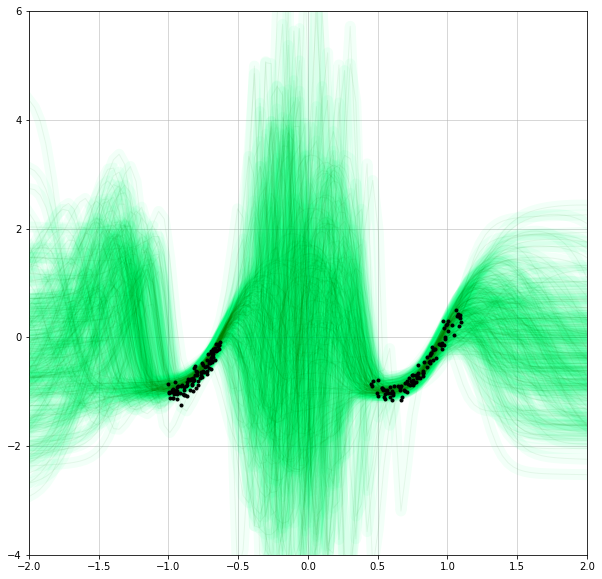

Epoch [1000/20000], Bound: 0.7863940596580505, Entropy: -117.55094909667969, Temp: 3.2377474308013916, KL: 264.8589172363281, Loss: 0.01626530848443508, Learning Rate: 0.015
Epoch [1001/20000], Bound: 0.7903856039047241, Entropy: -121.96408081054688, Temp: 3.240652084350586, KL: 267.56536865234375, Loss: 0.017069127410650253, Learning Rate: 0.015
Epoch [1002/20000], Bound: 0.7963361740112305, Entropy: -121.34652709960938, Temp: 3.2434651851654053, KL: 273.151123046875, Loss: 0.01597551815211773, Learning Rate: 0.015
Epoch [1003/20000], Bound: 0.7892327308654785, Entropy: -126.53469848632812, Temp: 3.246224880218506, KL: 267.4410400390625, Loss: 0.016034934669733047, Learning Rate: 0.015
Epoch [1004/20000], Bound: 0.7861840724945068, Entropy: -121.98983764648438, Temp: 3.2489266395568848, KL: 265.54083251953125, Loss: 0.015337919816374779, Learning Rate: 0.015
Epoch [1005/20000], Bound: 0.7902433276176453, Entropy: -118.62078857421875, Temp: 3.251587390899658, KL: 269.342529296875, Loss

Epoch [1048/20000], Bound: 0.7874966859817505, Entropy: -128.34019470214844, Temp: 3.3529183864593506, KL: 269.60736083984375, Loss: 0.014069706201553345, Learning Rate: 0.015
Epoch [1049/20000], Bound: 0.798444390296936, Entropy: -120.49380493164062, Temp: 3.354893684387207, KL: 274.55224609375, Loss: 0.020178964361548424, Learning Rate: 0.015
Epoch [1050/20000], Bound: 0.7845818996429443, Entropy: -126.16949462890625, Temp: 3.3567466735839844, KL: 269.93402099609375, Loss: 0.010225221514701843, Learning Rate: 0.015
Epoch [1051/20000], Bound: 0.7911134362220764, Entropy: -129.39242553710938, Temp: 3.3587076663970947, KL: 267.33673095703125, Loss: 0.021987294778227806, Learning Rate: 0.015
Epoch [1052/20000], Bound: 0.7930223941802979, Entropy: -124.95718383789062, Temp: 3.3604955673217773, KL: 272.7453308105469, Loss: 0.016319362446665764, Learning Rate: 0.015
Epoch [1053/20000], Bound: 0.7889906764030457, Entropy: -124.09352111816406, Temp: 3.3622612953186035, KL: 269.33209228515625,

Epoch [1098/20000], Bound: 0.7713832855224609, Entropy: -109.58230590820312, Temp: 3.4553720951080322, KL: 259.0831298828125, Loss: 0.013707468286156654, Learning Rate: 0.015
Epoch [1099/20000], Bound: 0.788108766078949, Entropy: -123.07905578613281, Temp: 3.4571382999420166, KL: 274.0263671875, Loss: 0.0112819354981184, Learning Rate: 0.015


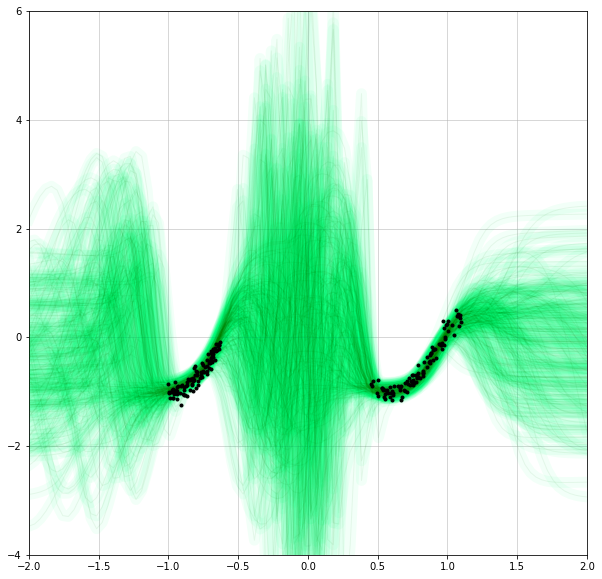

Epoch [1100/20000], Bound: 0.77898770570755, Entropy: -116.43719482421875, Temp: 3.458956003189087, KL: 266.71441650390625, Loss: 0.011306707747280598, Learning Rate: 0.015
Epoch [1101/20000], Bound: 0.7753155827522278, Entropy: -112.43754577636719, Temp: 3.460811138153076, KL: 264.59808349609375, Loss: 0.010255051776766777, Learning Rate: 0.015
Epoch [1102/20000], Bound: 0.7862696051597595, Entropy: -125.62286376953125, Temp: 3.462721347808838, KL: 270.778564453125, Loss: 0.013955826871097088, Learning Rate: 0.015
Epoch [1103/20000], Bound: 0.7910012006759644, Entropy: -128.72897338867188, Temp: 3.464599609375, KL: 277.2038879394531, Loss: 0.01033655647188425, Learning Rate: 0.015
Epoch [1104/20000], Bound: 0.7763906121253967, Entropy: -110.521240234375, Temp: 3.466540813446045, KL: 264.2376708984375, Loss: 0.012128669768571854, Learning Rate: 0.015
Epoch [1105/20000], Bound: 0.7905840277671814, Entropy: -119.95538330078125, Temp: 3.4684810638427734, KL: 272.53118896484375, Loss: 0.01

Epoch [1149/20000], Bound: 0.7794699668884277, Entropy: -123.93270874023438, Temp: 3.5254876613616943, KL: 267.89434814453125, Loss: 0.011793110519647598, Learning Rate: 0.015
Epoch [1150/20000], Bound: 0.7746168375015259, Entropy: -112.23716735839844, Temp: 3.526761531829834, KL: 263.267578125, Loss: 0.012948408722877502, Learning Rate: 0.015
Epoch [1151/20000], Bound: 0.7858641147613525, Entropy: -122.36865234375, Temp: 3.528055191040039, KL: 272.47479248046875, Loss: 0.01268220879137516, Learning Rate: 0.015
Epoch [1152/20000], Bound: 0.7831317782402039, Entropy: -118.76835632324219, Temp: 3.5293829441070557, KL: 265.31304931640625, Loss: 0.019709181040525436, Learning Rate: 0.015
Epoch [1153/20000], Bound: 0.7857679128646851, Entropy: -124.30368041992188, Temp: 3.53056001663208, KL: 273.95574951171875, Loss: 0.01053327415138483, Learning Rate: 0.015
Epoch [1154/20000], Bound: 0.7847943902015686, Entropy: -117.52548217773438, Temp: 3.5318357944488525, KL: 270.13623046875, Loss: 0.01

Epoch [1197/20000], Bound: 0.7890627980232239, Entropy: -121.60600280761719, Temp: 3.5750226974487305, KL: 274.32879638671875, Loss: 0.014880998060107231, Learning Rate: 0.015
Epoch [1198/20000], Bound: 0.7825943827629089, Entropy: -107.08695983886719, Temp: 3.5757811069488525, KL: 266.06634521484375, Loss: 0.0190056674182415, Learning Rate: 0.015
Epoch [1199/20000], Bound: 0.7893403768539429, Entropy: -124.28669738769531, Temp: 3.5764403343200684, KL: 269.65283203125, Loss: 0.021773817017674446, Learning Rate: 0.015


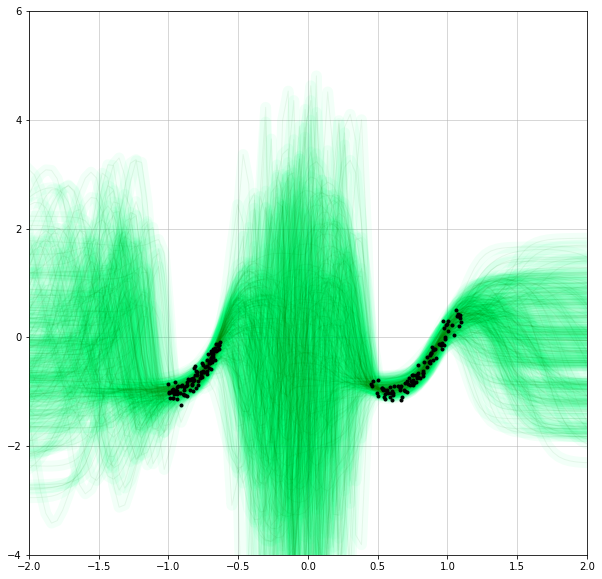

Epoch [1200/20000], Bound: 0.7845625877380371, Entropy: -121.30747985839844, Temp: 3.576943874359131, KL: 270.3018798828125, Loss: 0.015352818183600903, Learning Rate: 0.015
Epoch [1201/20000], Bound: 0.779580295085907, Entropy: -111.8172607421875, Temp: 3.577470302581787, KL: 267.65399169921875, Loss: 0.013419017195701599, Learning Rate: 0.015
Epoch [1202/20000], Bound: 0.776585578918457, Entropy: -109.53897094726562, Temp: 3.57806396484375, KL: 262.13592529296875, Loss: 0.017803458496928215, Learning Rate: 0.015
Epoch [1203/20000], Bound: 0.7818582653999329, Entropy: -123.91500854492188, Temp: 3.578598737716675, KL: 270.48297119140625, Loss: 0.012057335115969181, Learning Rate: 0.015
Epoch [1204/20000], Bound: 0.7771185040473938, Entropy: -112.07008361816406, Temp: 3.579237222671509, KL: 267.404296875, Loss: 0.011058206669986248, Learning Rate: 0.015
Epoch [1205/20000], Bound: 0.7776190042495728, Entropy: -109.22886657714844, Temp: 3.579991102218628, KL: 262.29534912109375, Loss: 0.0

Epoch [1249/20000], Bound: 0.7748523354530334, Entropy: -119.99493408203125, Temp: 3.6132707595825195, KL: 264.45635986328125, Loss: 0.013363928534090519, Learning Rate: 0.015
Epoch [1250/20000], Bound: 0.773179292678833, Entropy: -116.71578979492188, Temp: 3.6138575077056885, KL: 262.82550048828125, Loss: 0.013807022012770176, Learning Rate: 0.015
Epoch [1251/20000], Bound: 0.8022863864898682, Entropy: -142.9019775390625, Temp: 3.6144752502441406, KL: 282.88739013671875, Loss: 0.01966986432671547, Learning Rate: 0.015
Epoch [1252/20000], Bound: 0.7755393981933594, Entropy: -115.55538940429688, Temp: 3.614990234375, KL: 264.53387451171875, Loss: 0.014043591916561127, Learning Rate: 0.015
Epoch [1253/20000], Bound: 0.7823886871337891, Entropy: -114.85968017578125, Temp: 3.6155383586883545, KL: 265.6304016113281, Loss: 0.02015610970556736, Learning Rate: 0.015
Epoch [1254/20000], Bound: 0.7698855400085449, Entropy: -117.16033935546875, Temp: 3.6159560680389404, KL: 260.82562255859375, Lo

Epoch [1297/20000], Bound: 0.7696418166160583, Entropy: -106.10859680175781, Temp: 3.632051467895508, KL: 261.572021484375, Loss: 0.012073359452188015, Learning Rate: 0.0075
Epoch [1298/20000], Bound: 0.7783851027488708, Entropy: -119.65814208984375, Temp: 3.6328306198120117, KL: 266.7690734863281, Loss: 0.014443568885326385, Learning Rate: 0.0075
Epoch [1299/20000], Bound: 0.766830563545227, Entropy: -111.95889282226562, Temp: 3.6335668563842773, KL: 259.236328125, Loss: 0.012327823787927628, Learning Rate: 0.0075


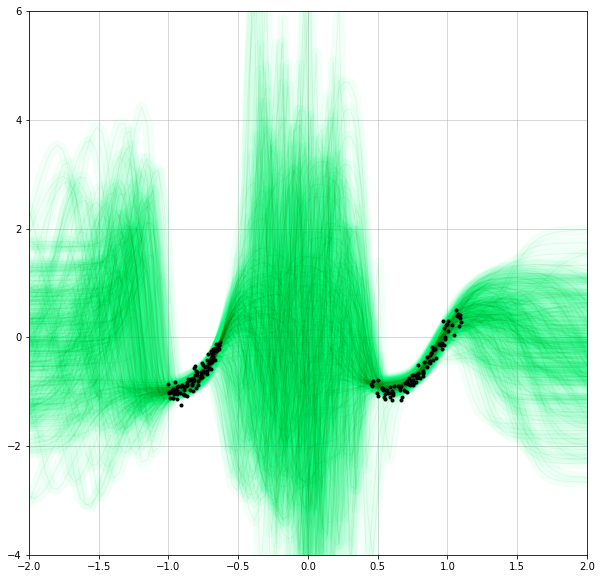

Epoch [1300/20000], Bound: 0.7662298083305359, Entropy: -107.9710693359375, Temp: 3.634289503097534, KL: 260.38232421875, Loss: 0.010130252689123154, Learning Rate: 0.0075
Epoch [1301/20000], Bound: 0.7697380185127258, Entropy: -116.53919982910156, Temp: 3.635030746459961, KL: 262.781005859375, Loss: 0.01056975219398737, Learning Rate: 0.0075
Epoch [1302/20000], Bound: 0.774183988571167, Entropy: -118.34658813476562, Temp: 3.6357834339141846, KL: 266.8124694824219, Loss: 0.009833569638431072, Learning Rate: 0.0075
Epoch [1303/20000], Bound: 0.7747898697853088, Entropy: -108.17294311523438, Temp: 3.636559009552002, KL: 262.5947265625, Loss: 0.016307907178997993, Learning Rate: 0.0075
Epoch [1304/20000], Bound: 0.7748764157295227, Entropy: -117.33352661132812, Temp: 3.637263774871826, KL: 264.6380615234375, Loss: 0.013606305234134197, Learning Rate: 0.0075
Epoch [1305/20000], Bound: 0.769301176071167, Entropy: -115.82777404785156, Temp: 3.6379425525665283, KL: 262.5918273925781, Loss: 0.

Epoch [1349/20000], Bound: 0.7687471508979797, Entropy: -108.8865966796875, Temp: 3.6739180088043213, KL: 263.90313720703125, Loss: 0.008723201230168343, Learning Rate: 0.0075
Epoch [1350/20000], Bound: 0.7695305943489075, Entropy: -104.83685302734375, Temp: 3.6748056411743164, KL: 262.5406799316406, Loss: 0.011423604562878609, Learning Rate: 0.0075
Epoch [1351/20000], Bound: 0.7726545929908752, Entropy: -131.74771118164062, Temp: 3.675671100616455, KL: 267.2042236328125, Loss: 0.008429797366261482, Learning Rate: 0.0075
Epoch [1352/20000], Bound: 0.7759410738945007, Entropy: -123.76481628417969, Temp: 3.676561117172241, KL: 266.8200988769531, Loss: 0.012521272525191307, Learning Rate: 0.0075
Epoch [1353/20000], Bound: 0.7739912867546082, Entropy: -123.92982482910156, Temp: 3.677415132522583, KL: 268.0343933105469, Loss: 0.008773447945713997, Learning Rate: 0.0075
Epoch [1354/20000], Bound: 0.773883581161499, Entropy: -122.24980163574219, Temp: 3.678290367126465, KL: 266.8314208984375,

Epoch [1397/20000], Bound: 0.7648370265960693, Entropy: -116.30133056640625, Temp: 3.710792064666748, KL: 260.40802001953125, Loss: 0.010026063770055771, Learning Rate: 0.0075
Epoch [1398/20000], Bound: 0.7608924508094788, Entropy: -98.93084716796875, Temp: 3.7115209102630615, KL: 256.9481201171875, Loss: 0.010646016336977482, Learning Rate: 0.0075
Epoch [1399/20000], Bound: 0.7685033082962036, Entropy: -111.62220764160156, Temp: 3.712244987487793, KL: 263.91790771484375, Loss: 0.009146192111074924, Learning Rate: 0.0075


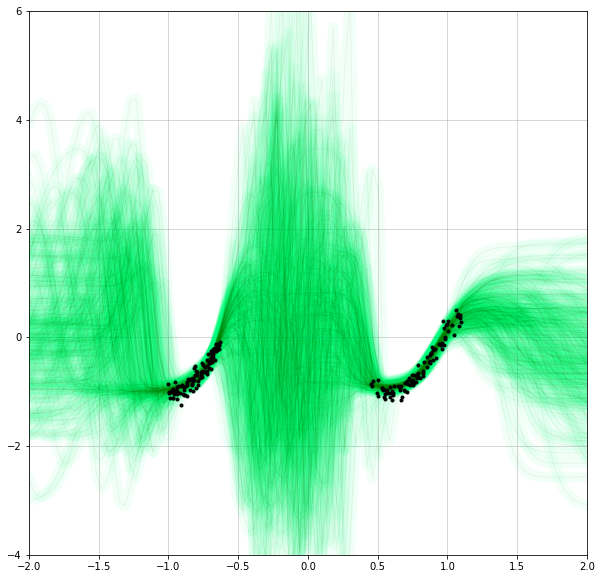

Epoch [1400/20000], Bound: 0.770423948764801, Entropy: -121.26467895507812, Temp: 3.7129900455474854, KL: 263.897216796875, Loss: 0.011211377568542957, Learning Rate: 0.0075
Epoch [1401/20000], Bound: 0.761897087097168, Entropy: -119.92230224609375, Temp: 3.7137231826782227, KL: 259.9322204589844, Loss: 0.007690979167819023, Learning Rate: 0.0075
Epoch [1402/20000], Bound: 0.7689438462257385, Entropy: -119.744384765625, Temp: 3.71449613571167, KL: 264.518798828125, Loss: 0.008840106427669525, Learning Rate: 0.0075
Epoch [1403/20000], Bound: 0.7746016979217529, Entropy: -120.9727783203125, Temp: 3.71528959274292, KL: 267.6632080078125, Loss: 0.010637535713613033, Learning Rate: 0.0075
Epoch [1404/20000], Bound: 0.7742851972579956, Entropy: -126.54922485351562, Temp: 3.716076612472534, KL: 267.6400146484375, Loss: 0.010342871770262718, Learning Rate: 0.0075
Epoch [1405/20000], Bound: 0.7655229568481445, Entropy: -111.79281616210938, Temp: 3.716862201690674, KL: 259.60662841796875, Loss: 

Epoch [1448/20000], Bound: 0.7675634622573853, Entropy: -116.28076171875, Temp: 3.745213508605957, KL: 263.13519287109375, Loss: 0.0097812470048666, Learning Rate: 0.0075
Epoch [1449/20000], Bound: 0.7719147801399231, Entropy: -114.42822265625, Temp: 3.7457923889160156, KL: 265.78680419921875, Loss: 0.010816912166774273, Learning Rate: 0.0075
Epoch [1450/20000], Bound: 0.7738207578659058, Entropy: -125.682373046875, Temp: 3.746377468109131, KL: 265.74786376953125, Loss: 0.012903264723718166, Learning Rate: 0.0075
Epoch [1451/20000], Bound: 0.7635259628295898, Entropy: -112.60531616210938, Temp: 3.746936321258545, KL: 257.7394104003906, Loss: 0.012843560427427292, Learning Rate: 0.0075
Epoch [1452/20000], Bound: 0.7637386918067932, Entropy: -107.22344970703125, Temp: 3.747467517852783, KL: 259.5355224609375, Loss: 0.010673211887478828, Learning Rate: 0.0075
Epoch [1453/20000], Bound: 0.770298957824707, Entropy: -115.58090209960938, Temp: 3.7480082511901855, KL: 263.8989562988281, Loss: 

Epoch [1495/20000], Bound: 0.7649195790290833, Entropy: -107.77389526367188, Temp: 3.765113353729248, KL: 258.9883117675781, Loss: 0.012888277880847454, Learning Rate: 0.0075
Epoch [1496/20000], Bound: 0.7698561549186707, Entropy: -118.10726928710938, Temp: 3.765285015106201, KL: 264.75762939453125, Loss: 0.010344830341637135, Learning Rate: 0.0075
Epoch [1497/20000], Bound: 0.7749549150466919, Entropy: -117.27021789550781, Temp: 3.765507221221924, KL: 265.4072265625, Loss: 0.014874348416924477, Learning Rate: 0.0075
Epoch [1498/20000], Bound: 0.7595788240432739, Entropy: -107.95632934570312, Temp: 3.76570463180542, KL: 255.5146026611328, Loss: 0.01208480354398489, Learning Rate: 0.0075
Epoch [1499/20000], Bound: 0.7821016311645508, Entropy: -133.58563232421875, Temp: 3.7659175395965576, KL: 274.0933837890625, Loss: 0.011089257895946503, Learning Rate: 0.0075


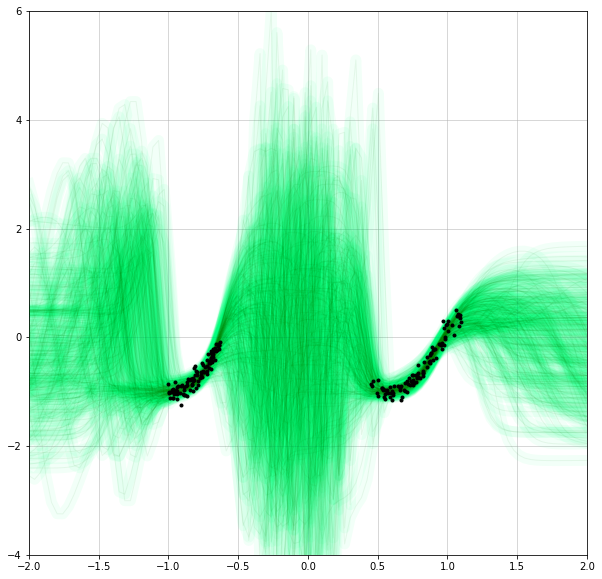

Epoch [1500/20000], Bound: 0.7777172923088074, Entropy: -113.05126953125, Temp: 3.7661702632904053, KL: 267.11602783203125, Loss: 0.015581394545733929, Learning Rate: 0.0075
Epoch [1501/20000], Bound: 0.7699512243270874, Entropy: -120.62396240234375, Temp: 3.766385078430176, KL: 264.242431640625, Loss: 0.01114611979573965, Learning Rate: 0.0075
Epoch [1502/20000], Bound: 0.7710281610488892, Entropy: -121.42207336425781, Temp: 3.7666330337524414, KL: 264.38922119140625, Loss: 0.012084501795470715, Learning Rate: 0.0075
Epoch [1503/20000], Bound: 0.7740959525108337, Entropy: -123.05870056152344, Temp: 3.7668964862823486, KL: 267.1224670410156, Loss: 0.011704036965966225, Learning Rate: 0.0075
Epoch [1504/20000], Bound: 0.769493043422699, Entropy: -119.73921203613281, Temp: 3.767181396484375, KL: 262.5289611816406, Loss: 0.01295427419245243, Learning Rate: 0.0075
Epoch [1505/20000], Bound: 0.7678419947624207, Entropy: -115.42381286621094, Temp: 3.767462968826294, KL: 261.03704833984375, L

Epoch [1547/20000], Bound: 0.7652908563613892, Entropy: -119.319580078125, Temp: 3.7875068187713623, KL: 262.1355285644531, Loss: 0.009447270072996616, Learning Rate: 0.0075
Epoch [1548/20000], Bound: 0.777895987033844, Entropy: -127.72193908691406, Temp: 3.788109540939331, KL: 271.12738037109375, Loss: 0.010818125680088997, Learning Rate: 0.0075
Epoch [1549/20000], Bound: 0.7803125977516174, Entropy: -129.64581298828125, Temp: 3.7887120246887207, KL: 270.48193359375, Loss: 0.014293602667748928, Learning Rate: 0.0075
Epoch [1550/20000], Bound: 0.7719398736953735, Entropy: -119.33306884765625, Temp: 3.7892587184906006, KL: 267.8934326171875, Loss: 0.008771632798016071, Learning Rate: 0.0075
Epoch [1551/20000], Bound: 0.7688393592834473, Entropy: -114.03964233398438, Temp: 3.789841890335083, KL: 264.4378662109375, Loss: 0.01010308600962162, Learning Rate: 0.0075
Epoch [1552/20000], Bound: 0.7677425146102905, Entropy: -115.63531494140625, Temp: 3.7904348373413086, KL: 264.3426513671875, L

Epoch [1596/20000], Bound: 0.7773573398590088, Entropy: -122.60096740722656, Temp: 3.8178844451904297, KL: 270.5123291015625, Loss: 0.011528139002621174, Learning Rate: 0.0075
Epoch [1597/20000], Bound: 0.764091432094574, Entropy: -116.57785034179688, Temp: 3.8185534477233887, KL: 262.2530212402344, Loss: 0.008549166843295097, Learning Rate: 0.0075
Epoch [1598/20000], Bound: 0.7602866888046265, Entropy: -112.33927917480469, Temp: 3.8192429542541504, KL: 258.05633544921875, Loss: 0.010225783102214336, Learning Rate: 0.0075
Epoch [1599/20000], Bound: 0.7742984294891357, Entropy: -121.31304931640625, Temp: 3.819920539855957, KL: 268.7402648925781, Loss: 0.010631983168423176, Learning Rate: 0.0075


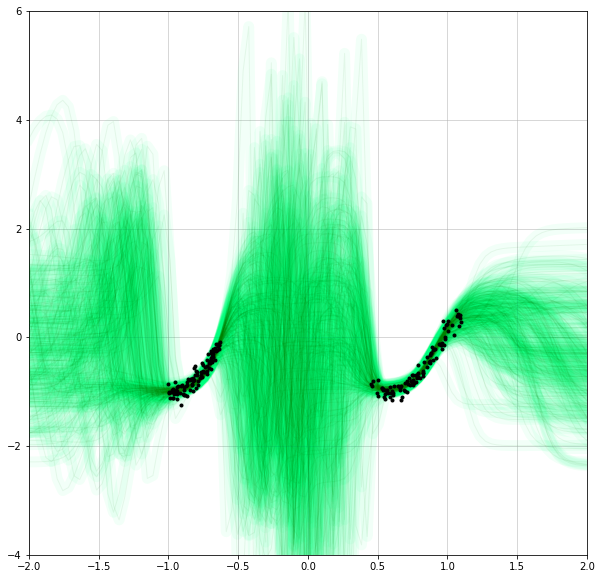

Epoch [1600/20000], Bound: 0.765861988067627, Entropy: -118.78828430175781, Temp: 3.8205862045288086, KL: 263.87982177734375, Loss: 0.008251219987869263, Learning Rate: 0.0075
Epoch [1601/20000], Bound: 0.7670295238494873, Entropy: -112.55007934570312, Temp: 3.8212783336639404, KL: 261.79620361328125, Loss: 0.012181938625872135, Learning Rate: 0.0075
Epoch [1602/20000], Bound: 0.7719686031341553, Entropy: -124.25814819335938, Temp: 3.821927309036255, KL: 266.5633544921875, Loss: 0.01106523722410202, Learning Rate: 0.0075
Epoch [1603/20000], Bound: 0.7750781178474426, Entropy: -123.72203063964844, Temp: 3.822558879852295, KL: 269.3830261230469, Loss: 0.010655693709850311, Learning Rate: 0.0075
Epoch [1604/20000], Bound: 0.7645703554153442, Entropy: -112.13504028320312, Temp: 3.8231825828552246, KL: 262.4957580566406, Loss: 0.00878717377781868, Learning Rate: 0.0075
Epoch [1605/20000], Bound: 0.7664738297462463, Entropy: -118.51254272460938, Temp: 3.823826789855957, KL: 262.7681274414062

Epoch [1647/20000], Bound: 0.7728651165962219, Entropy: -117.68028259277344, Temp: 3.841552972793579, KL: 267.90728759765625, Loss: 0.010543985292315483, Learning Rate: 0.00375
Epoch [1648/20000], Bound: 0.7626469731330872, Entropy: -110.86468505859375, Temp: 3.8419032096862793, KL: 260.1310729980469, Loss: 0.010203889571130276, Learning Rate: 0.00375
Epoch [1649/20000], Bound: 0.7667993307113647, Entropy: -112.19647216796875, Temp: 3.842273473739624, KL: 263.08917236328125, Loss: 0.010561810806393623, Learning Rate: 0.00375
Epoch [1650/20000], Bound: 0.7704391479492188, Entropy: -120.13505554199219, Temp: 3.842656373977661, KL: 266.5587158203125, Loss: 0.009792553260922432, Learning Rate: 0.00375
Epoch [1651/20000], Bound: 0.7560771107673645, Entropy: -104.40284729003906, Temp: 3.843066453933716, KL: 256.43780517578125, Loss: 0.00851343385875225, Learning Rate: 0.00375
Epoch [1652/20000], Bound: 0.7622491121292114, Entropy: -114.40716552734375, Temp: 3.8435168266296387, KL: 258.799835

Epoch [1694/20000], Bound: 0.7585304379463196, Entropy: -110.55337524414062, Temp: 3.863940715789795, KL: 258.23370361328125, Loss: 0.008880631066858768, Learning Rate: 0.00375
Epoch [1695/20000], Bound: 0.7618693709373474, Entropy: -103.830322265625, Temp: 3.864534616470337, KL: 257.738525390625, Loss: 0.012836921028792858, Learning Rate: 0.00375
Epoch [1696/20000], Bound: 0.7633302807807922, Entropy: -119.67254638671875, Temp: 3.8650712966918945, KL: 261.6806945800781, Loss: 0.009204713627696037, Learning Rate: 0.00375
Epoch [1697/20000], Bound: 0.7649762630462646, Entropy: -110.28451538085938, Temp: 3.8656234741210938, KL: 264.0160827636719, Loss: 0.007846904918551445, Learning Rate: 0.00375
Epoch [1698/20000], Bound: 0.7618514895439148, Entropy: -116.39138793945312, Temp: 3.8662149906158447, KL: 261.3446044921875, Loss: 0.008177343755960464, Learning Rate: 0.00375
Epoch [1699/20000], Bound: 0.7552967667579651, Entropy: -105.35337829589844, Temp: 3.8668344020843506, KL: 256.02462768

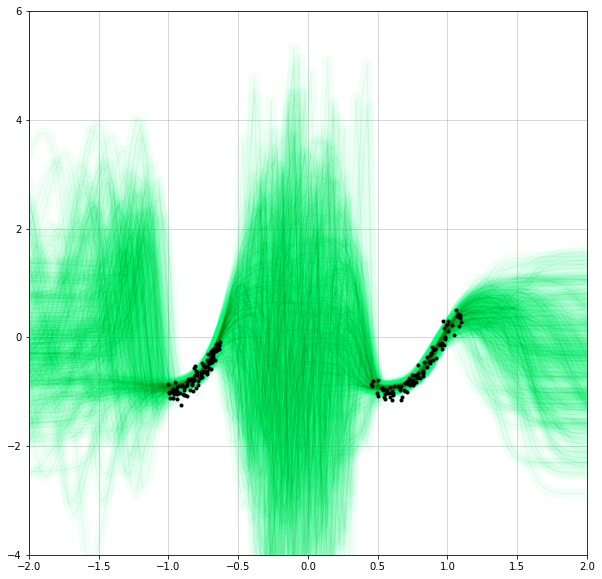

Epoch [1700/20000], Bound: 0.7624434232711792, Entropy: -115.5081787109375, Temp: 3.8674678802490234, KL: 261.4234313964844, Loss: 0.008683535270392895, Learning Rate: 0.00375
Epoch [1701/20000], Bound: 0.7614923119544983, Entropy: -116.56297302246094, Temp: 3.8681159019470215, KL: 260.735595703125, Loss: 0.00863373652100563, Learning Rate: 0.00375
Epoch [1702/20000], Bound: 0.7584271430969238, Entropy: -111.58767700195312, Temp: 3.8687775135040283, KL: 259.1230773925781, Loss: 0.007695659063756466, Learning Rate: 0.00375
Epoch [1703/20000], Bound: 0.7727149128913879, Entropy: -130.4472198486328, Temp: 3.869466781616211, KL: 269.92218017578125, Loss: 0.00819285586476326, Learning Rate: 0.00375
Epoch [1704/20000], Bound: 0.7651540637016296, Entropy: -107.5018310546875, Temp: 3.87017822265625, KL: 262.69049072265625, Loss: 0.009804503992199898, Learning Rate: 0.00375
Epoch [1705/20000], Bound: 0.7581705451011658, Entropy: -106.36874389648438, Temp: 3.8708763122558594, KL: 258.20330810546

Epoch [1749/20000], Bound: 0.7589035034179688, Entropy: -112.25900268554688, Temp: 3.8911426067352295, KL: 259.6291198730469, Loss: 0.007818033918738365, Learning Rate: 0.001875
Epoch [1750/20000], Bound: 0.7591606378555298, Entropy: -117.83625793457031, Temp: 3.8914856910705566, KL: 259.24847412109375, Loss: 0.008564075455069542, Learning Rate: 0.001875
Epoch [1751/20000], Bound: 0.7671262621879578, Entropy: -122.04150390625, Temp: 3.891831874847412, KL: 265.9105224609375, Loss: 0.007953079417347908, Learning Rate: 0.001875
Epoch [1752/20000], Bound: 0.7576709389686584, Entropy: -100.38241577148438, Temp: 3.892188549041748, KL: 258.49517822265625, Loss: 0.008082663640379906, Learning Rate: 0.001875
Epoch [1753/20000], Bound: 0.7607724666595459, Entropy: -114.4937744140625, Temp: 3.8925514221191406, KL: 260.9772033691406, Loss: 0.007945251651108265, Learning Rate: 0.001875
Epoch [1754/20000], Bound: 0.7716687917709351, Entropy: -128.92796325683594, Temp: 3.8929216861724854, KL: 268.186

Epoch [1798/20000], Bound: 0.7748652100563049, Entropy: -126.57814025878906, Temp: 3.908311605453491, KL: 270.78924560546875, Loss: 0.009879029355943203, Learning Rate: 0.001875
Epoch [1799/20000], Bound: 0.7544058561325073, Entropy: -103.67031860351562, Temp: 3.9086883068084717, KL: 255.97967529296875, Loss: 0.008358585648238659, Learning Rate: 0.001875


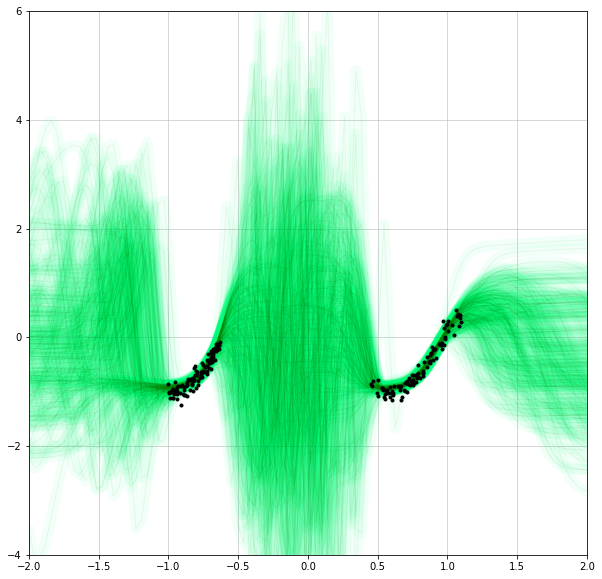

Epoch [1800/20000], Bound: 0.762033998966217, Entropy: -115.89445495605469, Temp: 3.909065008163452, KL: 262.27862548828125, Loss: 0.007748061325401068, Learning Rate: 0.001875
Epoch [1801/20000], Bound: 0.7626534104347229, Entropy: -108.98530578613281, Temp: 3.9094488620758057, KL: 261.31414794921875, Loss: 0.00960055273026228, Learning Rate: 0.001875
Epoch [1802/20000], Bound: 0.7615546584129333, Entropy: -117.80450439453125, Temp: 3.9098217487335205, KL: 261.81182861328125, Loss: 0.007881089113652706, Learning Rate: 0.001875
Epoch [1803/20000], Bound: 0.7593296766281128, Entropy: -103.38735961914062, Temp: 3.910200834274292, KL: 259.01068115234375, Loss: 0.009279614314436913, Learning Rate: 0.001875
Epoch [1804/20000], Bound: 0.7581560015678406, Entropy: -115.78042602539062, Temp: 3.910571575164795, KL: 259.21759033203125, Loss: 0.007872872054576874, Learning Rate: 0.001875
Epoch [1805/20000], Bound: 0.7590828537940979, Entropy: -106.65422058105469, Temp: 3.9109482765197754, KL: 258

Epoch [1849/20000], Bound: 0.7574120163917542, Entropy: -114.3026123046875, Temp: 3.924703598022461, KL: 257.9652404785156, Loss: 0.008928797207772732, Learning Rate: 0.001875
Epoch [1850/20000], Bound: 0.7588909864425659, Entropy: -104.2452392578125, Temp: 3.925067663192749, KL: 260.1868896484375, Loss: 0.00754155358299613, Learning Rate: 0.001875
Epoch [1851/20000], Bound: 0.7607637643814087, Entropy: -114.90328979492188, Temp: 3.925441265106201, KL: 261.3231506347656, Loss: 0.00793187040835619, Learning Rate: 0.001875
Epoch [1852/20000], Bound: 0.7585010528564453, Entropy: -109.6622314453125, Temp: 3.9258193969726562, KL: 257.6146240234375, Loss: 0.010447412729263306, Learning Rate: 0.001875
Epoch [1853/20000], Bound: 0.7604590654373169, Entropy: -118.447021484375, Temp: 3.9261765480041504, KL: 260.02215576171875, Loss: 0.009299198165535927, Learning Rate: 0.001875
Epoch [1854/20000], Bound: 0.7593424320220947, Entropy: -114.67539978027344, Temp: 3.9265263080596924, KL: 260.54595947

Epoch [1897/20000], Bound: 0.7599164247512817, Entropy: -111.06764221191406, Temp: 3.937373161315918, KL: 260.31103515625, Loss: 0.008541960269212723, Learning Rate: 0.0009375
Epoch [1898/20000], Bound: 0.7594408988952637, Entropy: -117.46624755859375, Temp: 3.937533140182495, KL: 260.1593933105469, Loss: 0.008272374048829079, Learning Rate: 0.0009375
Epoch [1899/20000], Bound: 0.7673488855361938, Entropy: -127.32083129882812, Temp: 3.9376959800720215, KL: 264.48468017578125, Loss: 0.010612846352159977, Learning Rate: 0.0009375


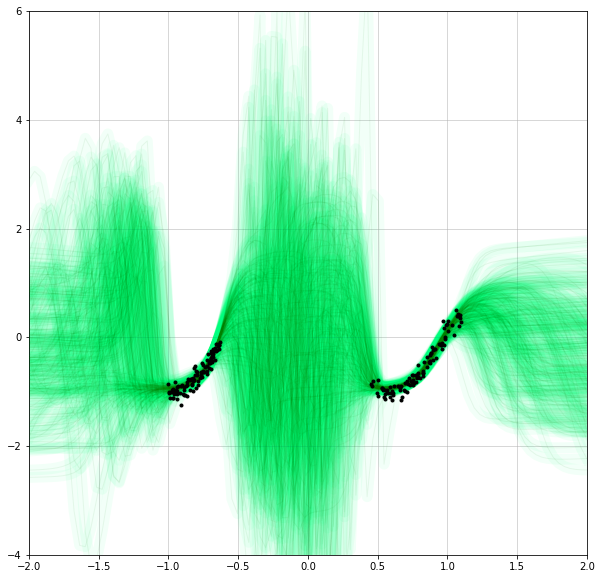

Epoch [1900/20000], Bound: 0.761309027671814, Entropy: -114.62506103515625, Temp: 3.9378507137298584, KL: 261.864501953125, Loss: 0.007939434610307217, Learning Rate: 0.0009375
Epoch [1901/20000], Bound: 0.7649253010749817, Entropy: -121.60479736328125, Temp: 3.9380106925964355, KL: 263.2685546875, Loss: 0.00973549298942089, Learning Rate: 0.0009375
Epoch [1902/20000], Bound: 0.7578579783439636, Entropy: -117.96957397460938, Temp: 3.938166856765747, KL: 258.541015625, Loss: 0.008796410635113716, Learning Rate: 0.0009375
Epoch [1903/20000], Bound: 0.7539265751838684, Entropy: -104.95475769042969, Temp: 3.938323497772217, KL: 256.09295654296875, Loss: 0.00812472216784954, Learning Rate: 0.0009375
Epoch [1904/20000], Bound: 0.7596509456634521, Entropy: -111.99421691894531, Temp: 3.938483715057373, KL: 260.8737487792969, Loss: 0.0075823902152478695, Learning Rate: 0.0009375
Epoch [1905/20000], Bound: 0.7600694894790649, Entropy: -114.04696655273438, Temp: 3.938650369644165, KL: 259.9112548

Epoch [1950/20000], Bound: 0.7615455389022827, Entropy: -117.94700622558594, Temp: 3.9470887184143066, KL: 262.729248046875, Loss: 0.007193926256150007, Learning Rate: 0.0009375
Epoch [1951/20000], Bound: 0.7657709717750549, Entropy: -118.98052978515625, Temp: 3.947268009185791, KL: 264.855712890625, Loss: 0.008683751337230206, Learning Rate: 0.0009375
Epoch [1952/20000], Bound: 0.7572362422943115, Entropy: -111.4732666015625, Temp: 3.947446823120117, KL: 259.63677978515625, Loss: 0.006921521387994289, Learning Rate: 0.0009375
Epoch [1953/20000], Bound: 0.7595542073249817, Entropy: -116.81864929199219, Temp: 3.947633743286133, KL: 260.6944885253906, Loss: 0.007831472903490067, Learning Rate: 0.0009375
Epoch [1954/20000], Bound: 0.7563210725784302, Entropy: -111.51353454589844, Temp: 3.9478230476379395, KL: 257.4221496582031, Loss: 0.008849388919770718, Learning Rate: 0.0009375
Epoch [1955/20000], Bound: 0.7535346746444702, Entropy: -110.27995300292969, Temp: 3.9480092525482178, KL: 256

Epoch [1997/20000], Bound: 0.7486410140991211, Entropy: -101.97969055175781, Temp: 3.95365571975708, KL: 252.85609436035156, Loss: 0.007420173846185207, Learning Rate: 0.00046875
Epoch [1998/20000], Bound: 0.7600715756416321, Entropy: -116.070068359375, Temp: 3.953751802444458, KL: 261.0191650390625, Loss: 0.00800114031881094, Learning Rate: 0.00046875
Epoch [1999/20000], Bound: 0.7515015602111816, Entropy: -103.0650634765625, Temp: 3.9538486003875732, KL: 254.08456420898438, Loss: 0.008553698658943176, Learning Rate: 0.00046875


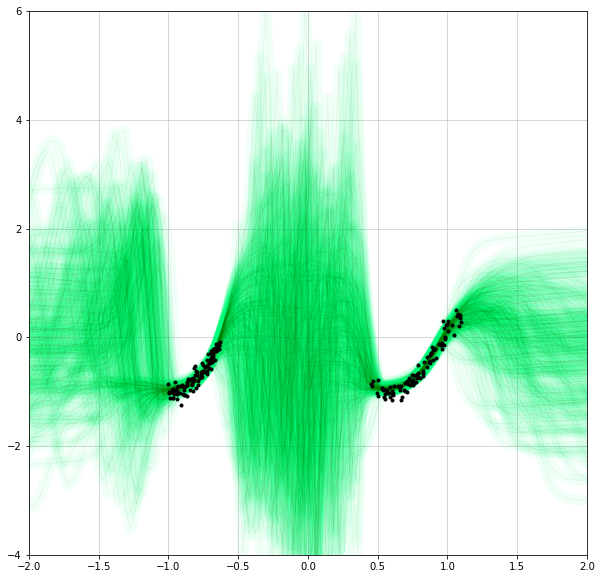

Epoch [2000/20000], Bound: 0.7664058208465576, Entropy: -126.06639099121094, Temp: 3.953944206237793, KL: 266.17230224609375, Loss: 0.007737548090517521, Learning Rate: 0.00046875
Epoch [2001/20000], Bound: 0.7547242045402527, Entropy: -114.60342407226562, Temp: 3.9540414810180664, KL: 257.8916015625, Loss: 0.006800823844969273, Learning Rate: 0.00046875
Epoch [2002/20000], Bound: 0.7554659843444824, Entropy: -106.41796875, Temp: 3.9541420936584473, KL: 255.7977294921875, Loss: 0.010159101337194443, Learning Rate: 0.00046875
Epoch [2003/20000], Bound: 0.7726761102676392, Entropy: -134.86997985839844, Temp: 3.9542369842529297, KL: 272.097900390625, Loss: 0.006591695826500654, Learning Rate: 0.00046875
Epoch [2004/20000], Bound: 0.7621523141860962, Entropy: -121.80288696289062, Temp: 3.9543368816375732, KL: 263.3883056640625, Loss: 0.007048937026411295, Learning Rate: 0.00046875
Epoch [2005/20000], Bound: 0.7596737146377563, Entropy: -115.50651550292969, Temp: 3.954440116882324, KL: 261.

Epoch [2048/20000], Bound: 0.7532718181610107, Entropy: -111.463623046875, Temp: 3.9586405754089355, KL: 256.7353210449219, Loss: 0.006935873068869114, Learning Rate: 0.00046875
Epoch [2049/20000], Bound: 0.7497801184654236, Entropy: -104.84474182128906, Temp: 3.958735942840576, KL: 253.41293334960938, Loss: 0.007841250859200954, Learning Rate: 0.00046875
Epoch [2050/20000], Bound: 0.7553479671478271, Entropy: -116.74554443359375, Temp: 3.958831787109375, KL: 258.09100341796875, Loss: 0.007203870452940464, Learning Rate: 0.00046875
Epoch [2051/20000], Bound: 0.7582275867462158, Entropy: -117.28414916992188, Temp: 3.958930492401123, KL: 260.71295166015625, Loss: 0.006662851199507713, Learning Rate: 0.00046875
Epoch [2052/20000], Bound: 0.7544280290603638, Entropy: -111.52618408203125, Temp: 3.959033250808716, KL: 257.5215759277344, Loss: 0.007047213613986969, Learning Rate: 0.00046875
Epoch [2053/20000], Bound: 0.7621935606002808, Entropy: -117.09400939941406, Temp: 3.9591383934020996, 

Epoch [2096/20000], Bound: 0.7601065635681152, Entropy: -112.01313781738281, Temp: 3.963486671447754, KL: 260.95623779296875, Loss: 0.008235082030296326, Learning Rate: 0.00046875
Epoch [2097/20000], Bound: 0.7605119347572327, Entropy: -114.76162719726562, Temp: 3.963587760925293, KL: 260.7918395996094, Loss: 0.008838413283228874, Learning Rate: 0.00046875
Epoch [2098/20000], Bound: 0.7591091990470886, Entropy: -115.37149047851562, Temp: 3.96368670463562, KL: 260.112548828125, Loss: 0.008333036676049232, Learning Rate: 0.00046875
Epoch [2099/20000], Bound: 0.7555506825447083, Entropy: -109.85078430175781, Temp: 3.9637362957000732, KL: 257.26031494140625, Loss: 0.008505319245159626, Learning Rate: 0.000234375


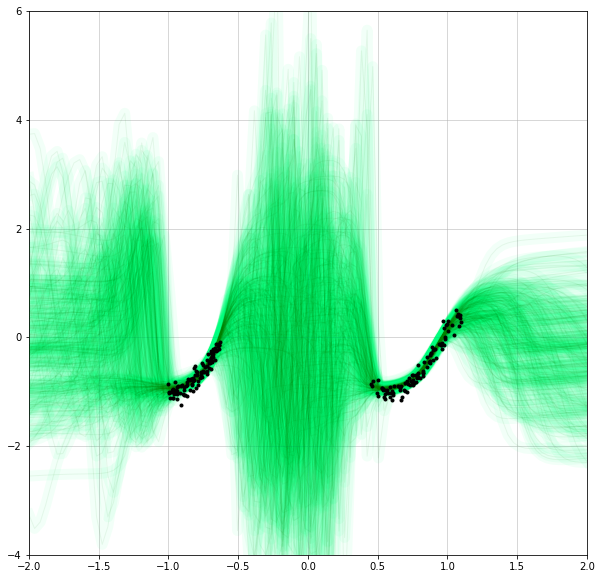

Epoch [2100/20000], Bound: 0.7554932832717896, Entropy: -117.41278076171875, Temp: 3.96378493309021, KL: 257.0107727050781, Loss: 0.008765717037022114, Learning Rate: 0.000234375
Epoch [2101/20000], Bound: 0.7651447653770447, Entropy: -117.97625732421875, Temp: 3.9638330936431885, KL: 264.8919982910156, Loss: 0.00822568777948618, Learning Rate: 0.000234375
Epoch [2102/20000], Bound: 0.7626247406005859, Entropy: -112.76409912109375, Temp: 3.963881254196167, KL: 263.0002136230469, Loss: 0.008124029263854027, Learning Rate: 0.000234375
Epoch [2103/20000], Bound: 0.7632625102996826, Entropy: -116.26141357421875, Temp: 3.9639296531677246, KL: 261.1081237792969, Loss: 0.011138789355754852, Learning Rate: 0.000234375
Epoch [2104/20000], Bound: 0.7511970400810242, Entropy: -106.04623413085938, Temp: 3.9639742374420166, KL: 254.8783721923828, Loss: 0.007383338175714016, Learning Rate: 0.000234375
Epoch [2105/20000], Bound: 0.7616850733757019, Entropy: -113.08950805664062, Temp: 3.96402025222778

Epoch [2146/20000], Bound: 0.7781292796134949, Entropy: -137.34890747070312, Temp: 3.9660279750823975, KL: 272.5268859863281, Loss: 0.011849562637507915, Learning Rate: 0.000234375
Epoch [2147/20000], Bound: 0.7560698986053467, Entropy: -106.7725830078125, Temp: 3.966071844100952, KL: 257.2014465332031, Loss: 0.009103953838348389, Learning Rate: 0.000234375
Epoch [2148/20000], Bound: 0.7582439184188843, Entropy: -114.70648193359375, Temp: 3.9661149978637695, KL: 259.82373046875, Loss: 0.007889451459050179, Learning Rate: 0.000234375
Epoch [2149/20000], Bound: 0.7639349699020386, Entropy: -120.58564758300781, Temp: 3.9661591053009033, KL: 264.104248046875, Loss: 0.008050856180489063, Learning Rate: 0.000234375
Epoch [2150/20000], Bound: 0.761227011680603, Entropy: -115.39253234863281, Temp: 3.9662044048309326, KL: 260.538818359375, Loss: 0.009886718355119228, Learning Rate: 0.000234375
Epoch [2151/20000], Bound: 0.7595467567443848, Entropy: -108.92958068847656, Temp: 3.96624755859375, K

Epoch [2193/20000], Bound: 0.7555726170539856, Entropy: -112.49371337890625, Temp: 3.9682793617248535, KL: 257.0098571777344, Loss: 0.008895468898117542, Learning Rate: 0.000234375
Epoch [2194/20000], Bound: 0.7694429755210876, Entropy: -130.7974853515625, Temp: 3.9683310985565186, KL: 267.411865234375, Loss: 0.009405924938619137, Learning Rate: 0.000234375
Epoch [2195/20000], Bound: 0.7537427544593811, Entropy: -116.30648803710938, Temp: 3.96838116645813, KL: 256.61285400390625, Loss: 0.007654231507331133, Learning Rate: 0.000234375
Epoch [2196/20000], Bound: 0.7654719352722168, Entropy: -122.7794189453125, Temp: 3.9684319496154785, KL: 265.35003662109375, Loss: 0.008030989207327366, Learning Rate: 0.000234375
Epoch [2197/20000], Bound: 0.762059211730957, Entropy: -109.816162109375, Temp: 3.9684832096099854, KL: 262.8914794921875, Loss: 0.007763564586639404, Learning Rate: 0.000234375
Epoch [2198/20000], Bound: 0.7538114786148071, Entropy: -108.96023559570312, Temp: 3.9685351848602295

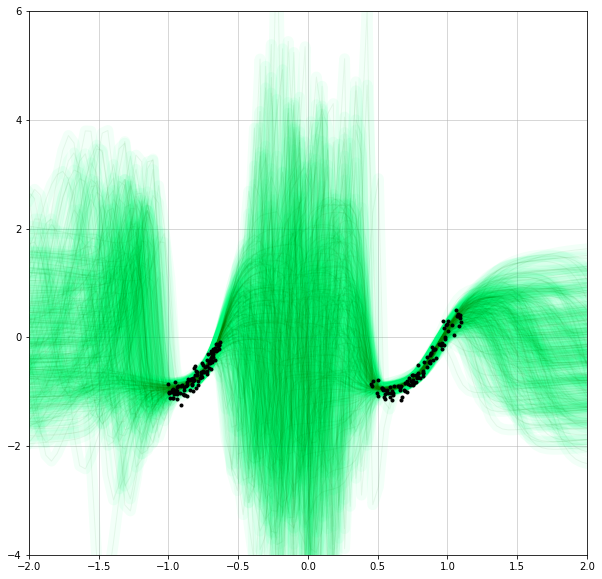

Epoch [2200/20000], Bound: 0.7557342052459717, Entropy: -121.34201049804688, Temp: 3.9686148166656494, KL: 258.07550048828125, Loss: 0.0077111911959946156, Learning Rate: 0.0001171875
Epoch [2201/20000], Bound: 0.7712149620056152, Entropy: -126.9197998046875, Temp: 3.968641996383667, KL: 266.4417724609375, Loss: 0.012425694614648819, Learning Rate: 0.0001171875
Epoch [2202/20000], Bound: 0.7657983303070068, Entropy: -117.2384033203125, Temp: 3.9686660766601562, KL: 265.0019226074219, Loss: 0.008796834386885166, Learning Rate: 0.0001171875
Epoch [2203/20000], Bound: 0.758443295955658, Entropy: -110.40231323242188, Temp: 3.9686901569366455, KL: 260.39825439453125, Loss: 0.007389473728835583, Learning Rate: 0.0001171875
Epoch [2204/20000], Bound: 0.7586016058921814, Entropy: -114.08375549316406, Temp: 3.968714475631714, KL: 260.4881896972656, Loss: 0.007429508026689291, Learning Rate: 0.0001171875
Epoch [2205/20000], Bound: 0.7565990686416626, Entropy: -111.88594055175781, Temp: 3.9687397

Epoch [2246/20000], Bound: 0.7672454714775085, Entropy: -125.33572387695312, Temp: 3.969780445098877, KL: 266.036376953125, Loss: 0.008950239047408104, Learning Rate: 0.0001171875
Epoch [2247/20000], Bound: 0.7659931778907776, Entropy: -113.13047790527344, Temp: 3.9698047637939453, KL: 265.38671875, Loss: 0.008520114235579967, Learning Rate: 0.0001171875
Epoch [2248/20000], Bound: 0.7608442902565002, Entropy: -109.564453125, Temp: 3.9698286056518555, KL: 262.52923583984375, Loss: 0.007049267180263996, Learning Rate: 0.0001171875
Epoch [2249/20000], Bound: 0.7558360695838928, Entropy: -103.98762512207031, Temp: 3.9698538780212402, KL: 258.39556884765625, Loss: 0.007420295383781195, Learning Rate: 0.0001171875
Epoch [2250/20000], Bound: 0.7662688493728638, Entropy: -121.15713500976562, Temp: 3.9698801040649414, KL: 265.41607666015625, Loss: 0.008758392184972763, Learning Rate: 0.0001171875
Epoch [2251/20000], Bound: 0.7624197602272034, Entropy: -113.10952758789062, Temp: 3.96990537643432

Epoch [2294/20000], Bound: 0.7588915824890137, Entropy: -111.16815185546875, Temp: 3.9710025787353516, KL: 261.0643310546875, Loss: 0.00701238214969635, Learning Rate: 0.0001171875
Epoch [2295/20000], Bound: 0.7670742273330688, Entropy: -119.93231201171875, Temp: 3.9710307121276855, KL: 266.370849609375, Loss: 0.008373666554689407, Learning Rate: 0.0001171875
Epoch [2296/20000], Bound: 0.7537614703178406, Entropy: -107.52520751953125, Temp: 3.9710583686828613, KL: 256.60870361328125, Loss: 0.007708829361945391, Learning Rate: 0.0001171875
Epoch [2297/20000], Bound: 0.7558495402336121, Entropy: -109.01895141601562, Temp: 3.9710865020751953, KL: 258.53363037109375, Loss: 0.007274155970662832, Learning Rate: 0.0001171875
Epoch [2298/20000], Bound: 0.7484176158905029, Entropy: -102.31092834472656, Temp: 3.9711151123046875, KL: 253.0374755859375, Loss: 0.0071869585663080215, Learning Rate: 0.0001171875
Epoch [2299/20000], Bound: 0.7568813562393188, Entropy: -112.04341125488281, Temp: 3.9711

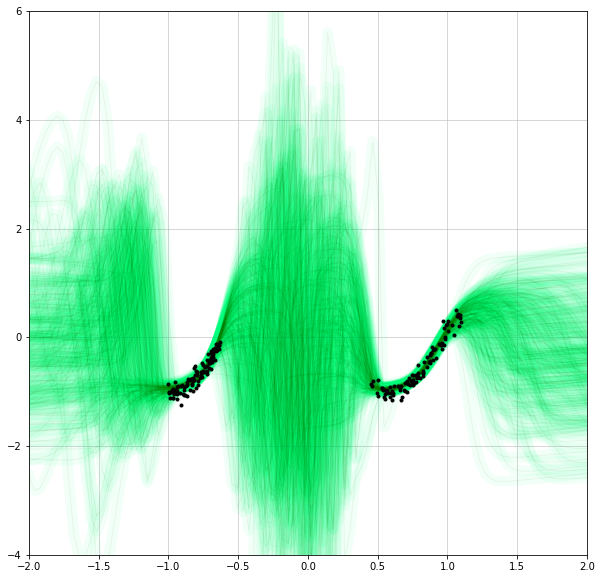

Epoch [2300/20000], Bound: 0.7634932994842529, Entropy: -124.73001098632812, Temp: 3.971173048019409, KL: 264.1344299316406, Loss: 0.007640121039003134, Learning Rate: 0.0001171875
Epoch [2301/20000], Bound: 0.7661258578300476, Entropy: -121.02456665039062, Temp: 3.9712023735046387, KL: 266.09259033203125, Loss: 0.007780830841511488, Learning Rate: 0.0001171875
Epoch [2302/20000], Bound: 0.7532176971435547, Entropy: -103.60462951660156, Temp: 3.971231698989868, KL: 255.320068359375, Loss: 0.008818083442747593, Learning Rate: 0.0001171875
Epoch [2303/20000], Bound: 0.75003981590271, Entropy: -107.05433654785156, Temp: 3.9712603092193604, KL: 253.24807739257812, Loss: 0.008436555974185467, Learning Rate: 0.0001171875
Epoch [2304/20000], Bound: 0.7613785862922668, Entropy: -110.03770446777344, Temp: 3.9712884426116943, KL: 262.13177490234375, Loss: 0.008089185692369938, Learning Rate: 0.0001171875
Epoch [2305/20000], Bound: 0.7657051682472229, Entropy: -124.95034790039062, Temp: 3.9713160

Epoch [2346/20000], Bound: 0.7593815922737122, Entropy: -117.84759521484375, Temp: 3.972341299057007, KL: 260.7640380859375, Loss: 0.00788119900971651, Learning Rate: 0.0001171875
Epoch [2347/20000], Bound: 0.7525932192802429, Entropy: -110.04716491699219, Temp: 3.97236704826355, KL: 254.72845458984375, Loss: 0.008985410444438457, Learning Rate: 0.0001171875
Epoch [2348/20000], Bound: 0.7617997527122498, Entropy: -116.10356140136719, Temp: 3.9723923206329346, KL: 262.32769775390625, Loss: 0.008267605677247047, Learning Rate: 0.0001171875
Epoch [2349/20000], Bound: 0.7540863752365112, Entropy: -107.812255859375, Temp: 3.9724173545837402, KL: 257.0711669921875, Loss: 0.007451097946614027, Learning Rate: 0.0001171875
Epoch [2350/20000], Bound: 0.7589787840843201, Entropy: -111.99775695800781, Temp: 3.9724435806274414, KL: 259.97296142578125, Loss: 0.008488168939948082, Learning Rate: 0.0001171875
Epoch [2351/20000], Bound: 0.7554116249084473, Entropy: -110.49685668945312, Temp: 3.97246956

Epoch [2394/20000], Bound: 0.7604295611381531, Entropy: -121.00326538085938, Temp: 3.9732446670532227, KL: 262.01580810546875, Loss: 0.007334211841225624, Learning Rate: 5.859375e-05
Epoch [2395/20000], Bound: 0.7555022835731506, Entropy: -113.11215209960938, Temp: 3.9732606410980225, KL: 258.47955322265625, Loss: 0.007036732509732246, Learning Rate: 5.859375e-05
Epoch [2396/20000], Bound: 0.7531961798667908, Entropy: -109.77099609375, Temp: 3.9732766151428223, KL: 256.48492431640625, Loss: 0.007355270441621542, Learning Rate: 5.859375e-05
Epoch [2397/20000], Bound: 0.7633364796638489, Entropy: -119.17298889160156, Temp: 3.973292827606201, KL: 264.029541015625, Loss: 0.007644319906830788, Learning Rate: 5.859375e-05
Epoch [2398/20000], Bound: 0.7592388391494751, Entropy: -122.334716796875, Temp: 3.97330904006958, KL: 261.259033203125, Loss: 0.0071317884139716625, Learning Rate: 5.859375e-05
Epoch [2399/20000], Bound: 0.7701641917228699, Entropy: -125.1114501953125, Temp: 3.973325490951

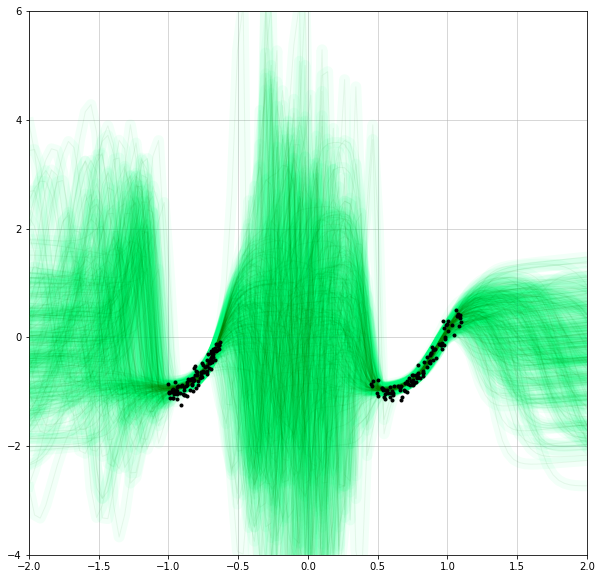

Epoch [2400/20000], Bound: 0.766131579875946, Entropy: -123.6826171875, Temp: 3.973341941833496, KL: 266.73785400390625, Loss: 0.007001672405749559, Learning Rate: 5.859375e-05
Epoch [2401/20000], Bound: 0.7692019939422607, Entropy: -122.91117858886719, Temp: 3.9733588695526123, KL: 268.70111083984375, Loss: 0.007603824138641357, Learning Rate: 5.859375e-05
Epoch [2402/20000], Bound: 0.75881028175354, Entropy: -113.69210815429688, Temp: 3.9733757972717285, KL: 260.20098876953125, Loss: 0.00804938655346632, Learning Rate: 5.859375e-05
Epoch [2403/20000], Bound: 0.7613281607627869, Entropy: -116.78036499023438, Temp: 3.9733922481536865, KL: 262.08465576171875, Loss: 0.008124977350234985, Learning Rate: 5.859375e-05
Epoch [2404/20000], Bound: 0.7555385828018188, Entropy: -121.77297973632812, Temp: 3.9734086990356445, KL: 257.8934631347656, Loss: 0.0078107151202857494, Learning Rate: 5.859375e-05
Epoch [2405/20000], Bound: 0.7611850500106812, Entropy: -113.78726196289062, Temp: 3.973424673

Epoch [2447/20000], Bound: 0.7612408995628357, Entropy: -120.61865234375, Temp: 3.9740710258483887, KL: 262.2293395996094, Loss: 0.007866091094911098, Learning Rate: 5.859375e-05
Epoch [2448/20000], Bound: 0.7647527456283569, Entropy: -123.66813659667969, Temp: 3.974086284637451, KL: 264.71380615234375, Loss: 0.008190278895199299, Learning Rate: 5.859375e-05
Epoch [2449/20000], Bound: 0.766289234161377, Entropy: -123.06318664550781, Temp: 3.9741015434265137, KL: 265.65142822265625, Loss: 0.008535043336451054, Learning Rate: 5.859375e-05
Epoch [2450/20000], Bound: 0.7622544765472412, Entropy: -117.97775268554688, Temp: 3.974116802215576, KL: 263.01226806640625, Loss: 0.007872376590967178, Learning Rate: 5.859375e-05
Epoch [2451/20000], Bound: 0.7623582482337952, Entropy: -122.78173828125, Temp: 3.9741320610046387, KL: 262.54754638671875, Loss: 0.008558899164199829, Learning Rate: 5.859375e-05
Epoch [2452/20000], Bound: 0.7606743574142456, Entropy: -122.01173400878906, Temp: 3.9741470813

Epoch [2493/20000], Bound: 0.7619706392288208, Entropy: -122.52906799316406, Temp: 3.9745266437530518, KL: 262.95562744140625, Loss: 0.007670896593481302, Learning Rate: 2.9296875e-05
Epoch [2494/20000], Bound: 0.7579959034919739, Entropy: -112.91012573242188, Temp: 3.974533796310425, KL: 260.06658935546875, Loss: 0.007446594536304474, Learning Rate: 2.9296875e-05
Epoch [2495/20000], Bound: 0.7565731406211853, Entropy: -115.74615478515625, Temp: 3.974541187286377, KL: 259.0232849121094, Loss: 0.007392096798866987, Learning Rate: 2.9296875e-05
Epoch [2496/20000], Bound: 0.7595196962356567, Entropy: -119.64852905273438, Temp: 3.974548578262329, KL: 261.4051818847656, Loss: 0.007235151249915361, Learning Rate: 2.9296875e-05
Epoch [2497/20000], Bound: 0.7589057683944702, Entropy: -110.96804809570312, Temp: 3.9745562076568604, KL: 260.41851806640625, Loss: 0.007882237434387207, Learning Rate: 2.9296875e-05
Epoch [2498/20000], Bound: 0.7622108459472656, Entropy: -124.41925048828125, Temp: 3.

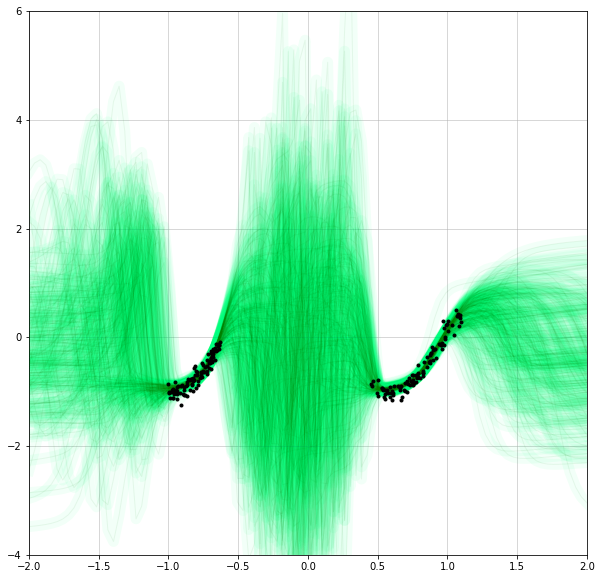

Epoch [2500/20000], Bound: 0.7546676993370056, Entropy: -105.4180908203125, Temp: 3.9745798110961914, KL: 256.6576232910156, Loss: 0.00854939129203558, Learning Rate: 2.9296875e-05
Epoch [2501/20000], Bound: 0.7584856748580933, Entropy: -111.23867797851562, Temp: 3.9745874404907227, KL: 259.87713623046875, Loss: 0.008157853037118912, Learning Rate: 2.9296875e-05
Epoch [2502/20000], Bound: 0.7578702569007874, Entropy: -107.04080200195312, Temp: 3.974595069885254, KL: 259.25860595703125, Loss: 0.008342716842889786, Learning Rate: 2.9296875e-05
Epoch [2503/20000], Bound: 0.7561884522438049, Entropy: -100.03364562988281, Temp: 3.974602699279785, KL: 258.42047119140625, Loss: 0.007782844360917807, Learning Rate: 2.9296875e-05
Epoch [2504/20000], Bound: 0.7623252868652344, Entropy: -122.42886352539062, Temp: 3.9746103286743164, KL: 262.65118408203125, Loss: 0.008402093313634396, Learning Rate: 2.9296875e-05
Epoch [2505/20000], Bound: 0.7619903087615967, Entropy: -120.40985107421875, Temp: 3.

Epoch [2546/20000], Bound: 0.7561510801315308, Entropy: -113.04476928710938, Temp: 3.9749279022216797, KL: 258.4092712402344, Loss: 0.007765104528516531, Learning Rate: 2.9296875e-05
Epoch [2547/20000], Bound: 0.7578950524330139, Entropy: -114.73379516601562, Temp: 3.974935293197632, KL: 258.3865966796875, Loss: 0.009467488154768944, Learning Rate: 2.9296875e-05
Epoch [2548/20000], Bound: 0.7559217214584351, Entropy: -111.84867858886719, Temp: 3.974942684173584, KL: 258.5970458984375, Loss: 0.007309740409255028, Learning Rate: 2.9296875e-05
Epoch [2549/20000], Bound: 0.7589229941368103, Entropy: -117.75668334960938, Temp: 3.974950075149536, KL: 261.2020263671875, Loss: 0.006918130908161402, Learning Rate: 2.9296875e-05
Epoch [2550/20000], Bound: 0.7582646608352661, Entropy: -111.82711791992188, Temp: 3.9749579429626465, KL: 260.550537109375, Loss: 0.007101979106664658, Learning Rate: 2.9296875e-05
Epoch [2551/20000], Bound: 0.7572663426399231, Entropy: -112.34965515136719, Temp: 3.9749

Epoch [2591/20000], Bound: 0.7510049939155579, Entropy: -103.806884765625, Temp: 3.9751670360565186, KL: 254.8864288330078, Loss: 0.0073239365592598915, Learning Rate: 1.46484375e-05
Epoch [2592/20000], Bound: 0.7573502659797668, Entropy: -103.82363891601562, Temp: 3.975170850753784, KL: 259.6485595703125, Loss: 0.007358890492469072, Learning Rate: 1.46484375e-05
Epoch [2593/20000], Bound: 0.7706602811813354, Entropy: -119.9107666015625, Temp: 3.975175142288208, KL: 270.2889099121094, Loss: 0.007102285511791706, Learning Rate: 1.46484375e-05
Epoch [2594/20000], Bound: 0.7576351165771484, Entropy: -110.44570922851562, Temp: 3.975179433822632, KL: 259.8687744140625, Loss: 0.007355882786214352, Learning Rate: 1.46484375e-05
Epoch [2595/20000], Bound: 0.7609829306602478, Entropy: -123.19358825683594, Temp: 3.9751834869384766, KL: 261.5919189453125, Loss: 0.00842988770455122, Learning Rate: 1.46484375e-05
Epoch [2596/20000], Bound: 0.7591373324394226, Entropy: -120.47564697265625, Temp: 3.9

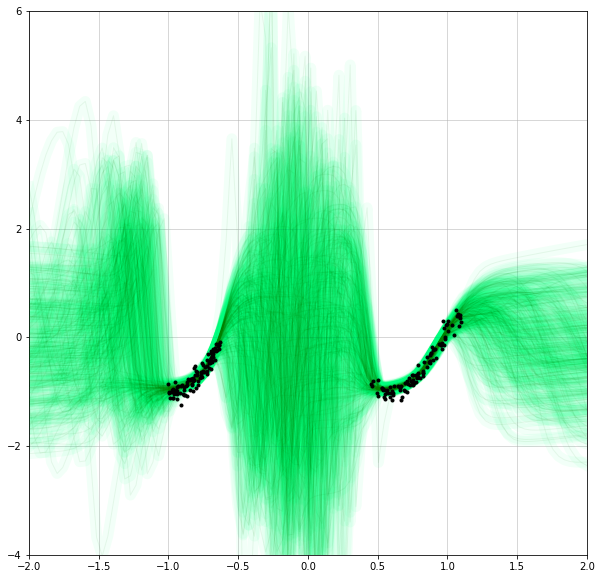

Epoch [2600/20000], Bound: 0.7596854567527771, Entropy: -110.58816528320312, Temp: 3.9752044677734375, KL: 260.70428466796875, Loss: 0.008285460062325, Learning Rate: 1.46484375e-05
Epoch [2601/20000], Bound: 0.7588723301887512, Entropy: -114.00802612304688, Temp: 3.975208282470703, KL: 258.5776672363281, Loss: 0.010173206217586994, Learning Rate: 1.46484375e-05
Epoch [2602/20000], Bound: 0.766502857208252, Entropy: -120.31851196289062, Temp: 3.9752120971679688, KL: 266.82293701171875, Loss: 0.007287993095815182, Learning Rate: 1.46484375e-05
Epoch [2603/20000], Bound: 0.7581254243850708, Entropy: -108.005615234375, Temp: 3.9752161502838135, KL: 260.46807861328125, Loss: 0.007074651774019003, Learning Rate: 1.46484375e-05
Epoch [2604/20000], Bound: 0.7574761509895325, Entropy: -107.70167541503906, Temp: 3.975219964981079, KL: 259.87335205078125, Loss: 0.007197750732302666, Learning Rate: 1.46484375e-05
Epoch [2605/20000], Bound: 0.7592772245407104, Entropy: -115.35104370117188, Temp: 3

Epoch [2646/20000], Bound: 0.7499567270278931, Entropy: -97.47993469238281, Temp: 3.9753878116607666, KL: 253.4025115966797, Loss: 0.00821137335151434, Learning Rate: 1.46484375e-05
Epoch [2647/20000], Bound: 0.750715434551239, Entropy: -101.99604797363281, Temp: 3.9753916263580322, KL: 254.65777587890625, Loss: 0.007342663127928972, Learning Rate: 1.46484375e-05
Epoch [2648/20000], Bound: 0.7600504159927368, Entropy: -116.00381469726562, Temp: 3.975395441055298, KL: 261.5185546875, Loss: 0.00761773344129324, Learning Rate: 1.46484375e-05
Epoch [2649/20000], Bound: 0.7666273713111877, Entropy: -123.3192138671875, Temp: 3.9753994941711426, KL: 265.7764892578125, Loss: 0.008730587549507618, Learning Rate: 1.46484375e-05
Epoch [2650/20000], Bound: 0.7575849294662476, Entropy: -112.47158813476562, Temp: 3.975403308868408, KL: 259.33074951171875, Loss: 0.007987027056515217, Learning Rate: 1.46484375e-05
Epoch [2651/20000], Bound: 0.7616910934448242, Entropy: -122.757568359375, Temp: 3.97540

Epoch [2694/20000], Bound: 0.7599447965621948, Entropy: -113.65304565429688, Temp: 3.975522518157959, KL: 262.14923095703125, Loss: 0.006723523139953613, Learning Rate: 7.32421875e-06
Epoch [2695/20000], Bound: 0.7569106817245483, Entropy: -110.21829223632812, Temp: 3.975524663925171, KL: 258.94366455078125, Loss: 0.007827705703675747, Learning Rate: 7.32421875e-06
Epoch [2696/20000], Bound: 0.7518302202224731, Entropy: -109.23800659179688, Temp: 3.975526809692383, KL: 254.4705352783203, Loss: 0.008626575581729412, Learning Rate: 7.32421875e-06
Epoch [2697/20000], Bound: 0.7606160044670105, Entropy: -119.17691040039062, Temp: 3.9755289554595947, KL: 261.63232421875, Loss: 0.008025986142456532, Learning Rate: 7.32421875e-06
Epoch [2698/20000], Bound: 0.7653908133506775, Entropy: -116.64675903320312, Temp: 3.9755308628082275, KL: 263.6153259277344, Loss: 0.010221466422080994, Learning Rate: 7.32421875e-06
Epoch [2699/20000], Bound: 0.7567644119262695, Entropy: -113.055908203125, Temp: 3.

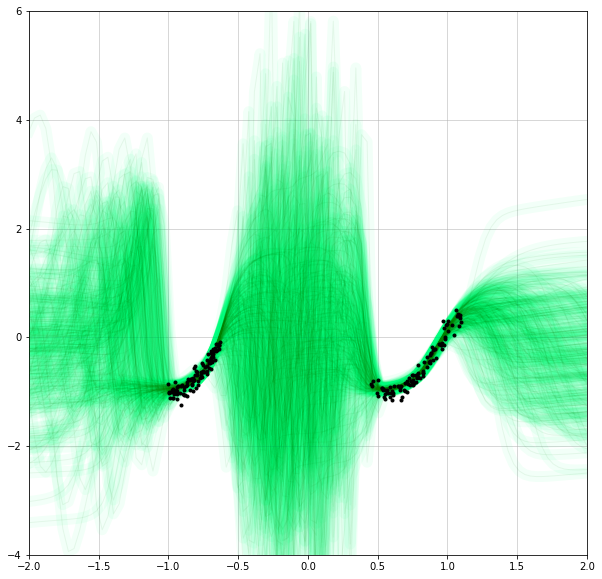

Epoch [2700/20000], Bound: 0.761962354183197, Entropy: -126.02374267578125, Temp: 3.9755349159240723, KL: 263.2156982421875, Loss: 0.007348082959651947, Learning Rate: 7.32421875e-06
Epoch [2701/20000], Bound: 0.760435163974762, Entropy: -112.76080322265625, Temp: 3.975537061691284, KL: 260.9998474121094, Loss: 0.008645618334412575, Learning Rate: 7.32421875e-06
Epoch [2702/20000], Bound: 0.7537130117416382, Entropy: -109.590087890625, Temp: 3.975539207458496, KL: 255.8927459716797, Loss: 0.008616108447313309, Learning Rate: 7.32421875e-06
Epoch [2703/20000], Bound: 0.7695168256759644, Entropy: -114.73480224609375, Temp: 3.975541353225708, KL: 268.77667236328125, Loss: 0.007854079827666283, Learning Rate: 7.32421875e-06
Epoch [2704/20000], Bound: 0.7578139305114746, Entropy: -118.30154418945312, Temp: 3.975543260574341, KL: 259.92437744140625, Loss: 0.007462457753717899, Learning Rate: 7.32421875e-06
Epoch [2705/20000], Bound: 0.756901204586029, Entropy: -104.60299682617188, Temp: 3.97

Epoch [2746/20000], Bound: 0.751910388469696, Entropy: -102.69264221191406, Temp: 3.9756240844726562, KL: 255.5464324951172, Loss: 0.007350017316639423, Learning Rate: 7.32421875e-06
Epoch [2747/20000], Bound: 0.7556705474853516, Entropy: -111.35223388671875, Temp: 3.975626230239868, KL: 258.2673034667969, Loss: 0.007492763921618462, Learning Rate: 7.32421875e-06
Epoch [2748/20000], Bound: 0.7572361826896667, Entropy: -110.32289123535156, Temp: 3.975628137588501, KL: 259.4990234375, Loss: 0.007442842703312635, Learning Rate: 7.32421875e-06
Epoch [2749/20000], Bound: 0.7651548981666565, Entropy: -118.414794921875, Temp: 3.975630283355713, KL: 264.01611328125, Loss: 0.00948485266417265, Learning Rate: 7.32421875e-06
Epoch [2750/20000], Bound: 0.759163498878479, Entropy: -119.09524536132812, Temp: 3.975632429122925, KL: 259.81512451171875, Loss: 0.008903326466679573, Learning Rate: 7.32421875e-06
Epoch [2751/20000], Bound: 0.7632172107696533, Entropy: -121.07781982421875, Temp: 3.97563433

Epoch [2791/20000], Bound: 0.7599867582321167, Entropy: -114.049072265625, Temp: 3.975689172744751, KL: 261.6953125, Loss: 0.007337178569287062, Learning Rate: 3.662109375e-06
Epoch [2792/20000], Bound: 0.7564663887023926, Entropy: -115.3330078125, Temp: 3.9756901264190674, KL: 258.6011962890625, Loss: 0.00783450249582529, Learning Rate: 3.662109375e-06
Epoch [2793/20000], Bound: 0.7573935389518738, Entropy: -105.86154174804688, Temp: 3.975691080093384, KL: 258.7086486816406, Loss: 0.008588796481490135, Learning Rate: 3.662109375e-06
Epoch [2794/20000], Bound: 0.7556676864624023, Entropy: -113.5047607421875, Temp: 3.975691795349121, KL: 258.10205078125, Loss: 0.007698589935898781, Learning Rate: 3.662109375e-06
Epoch [2795/20000], Bound: 0.7593451142311096, Entropy: -121.80877685546875, Temp: 3.9756929874420166, KL: 261.4231262207031, Loss: 0.007057561539113522, Learning Rate: 3.662109375e-06
Epoch [2796/20000], Bound: 0.763083815574646, Entropy: -109.21022033691406, Temp: 3.9756937026

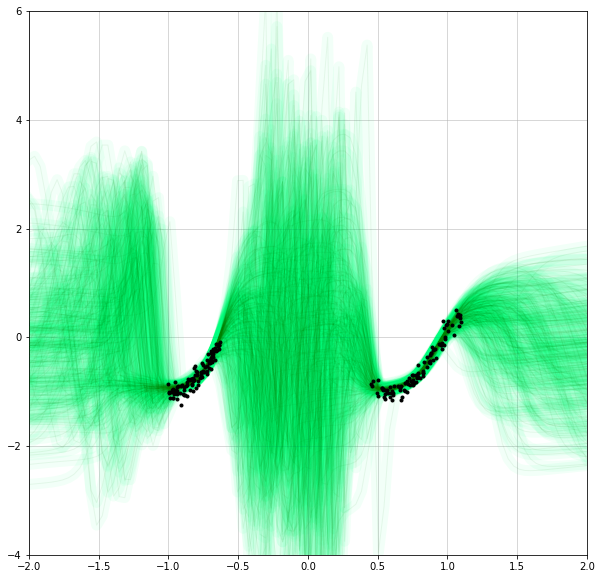

Epoch [2800/20000], Bound: 0.7647318243980408, Entropy: -125.64204406738281, Temp: 3.975698232650757, KL: 264.559326171875, Loss: 0.008383840322494507, Learning Rate: 3.662109375e-06
Epoch [2801/20000], Bound: 0.7588940858840942, Entropy: -104.98295593261719, Temp: 3.9756994247436523, KL: 260.374267578125, Loss: 0.00794039573520422, Learning Rate: 3.662109375e-06
Epoch [2802/20000], Bound: 0.7555299997329712, Entropy: -113.27130126953125, Temp: 3.975700616836548, KL: 257.78924560546875, Loss: 0.007960646413266659, Learning Rate: 3.662109375e-06
Epoch [2803/20000], Bound: 0.7575363516807556, Entropy: -113.31985473632812, Temp: 3.9757018089294434, KL: 259.08135986328125, Loss: 0.00825758557766676, Learning Rate: 3.662109375e-06
Epoch [2804/20000], Bound: 0.754127025604248, Entropy: -105.3360595703125, Temp: 3.975703001022339, KL: 256.6851806640625, Loss: 0.008014041930437088, Learning Rate: 3.662109375e-06
Epoch [2805/20000], Bound: 0.7586286664009094, Entropy: -113.9381103515625, Temp: 

Epoch [2845/20000], Bound: 0.7527449727058411, Entropy: -108.55850219726562, Temp: 3.9757437705993652, KL: 255.58103942871094, Loss: 0.00809472519904375, Learning Rate: 3.662109375e-06
Epoch [2846/20000], Bound: 0.7630623579025269, Entropy: -116.93537902832031, Temp: 3.9757449626922607, KL: 264.00994873046875, Loss: 0.007430079858750105, Learning Rate: 3.662109375e-06
Epoch [2847/20000], Bound: 0.7543392777442932, Entropy: -103.43136596679688, Temp: 3.9757461547851562, KL: 257.1095886230469, Loss: 0.007682353258132935, Learning Rate: 3.662109375e-06
Epoch [2848/20000], Bound: 0.7542198896408081, Entropy: -109.2041015625, Temp: 3.9757473468780518, KL: 256.93548583984375, Loss: 0.007787913084030151, Learning Rate: 3.662109375e-06
Epoch [2849/20000], Bound: 0.7620956897735596, Entropy: -118.09391784667969, Temp: 3.9757485389709473, KL: 261.48016357421875, Loss: 0.009663866832852364, Learning Rate: 3.662109375e-06
Epoch [2850/20000], Bound: 0.751867413520813, Entropy: -107.27764892578125, 

Epoch [2890/20000], Bound: 0.7564877867698669, Entropy: -102.68399047851562, Temp: 3.9757790565490723, KL: 257.2725830078125, Loss: 0.009526940062642097, Learning Rate: 1.8310546875e-06
Epoch [2891/20000], Bound: 0.7616679668426514, Entropy: -119.796142578125, Temp: 3.9757792949676514, KL: 261.6222839355469, Loss: 0.009067266248166561, Learning Rate: 1.8310546875e-06
Epoch [2892/20000], Bound: 0.752652108669281, Entropy: -105.22142028808594, Temp: 3.9757797718048096, KL: 254.11163330078125, Loss: 0.009855419397354126, Learning Rate: 1.8310546875e-06
Epoch [2893/20000], Bound: 0.7600929141044617, Entropy: -118.96209716796875, Temp: 3.975780487060547, KL: 260.6246337890625, Loss: 0.008787866681814194, Learning Rate: 1.8310546875e-06
Epoch [2894/20000], Bound: 0.7570045590400696, Entropy: -115.83692932128906, Temp: 3.975780963897705, KL: 259.39410400390625, Loss: 0.0073542967438697815, Learning Rate: 1.8310546875e-06
Epoch [2895/20000], Bound: 0.7584837675094604, Entropy: -119.74237060546

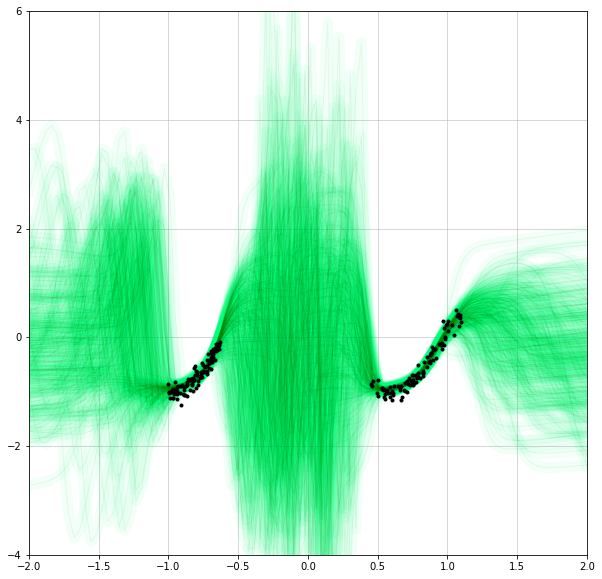

Epoch [2900/20000], Bound: 0.7535386085510254, Entropy: -112.83352661132812, Temp: 3.975783586502075, KL: 256.6352844238281, Loss: 0.007519776467233896, Learning Rate: 1.8310546875e-06
Epoch [2901/20000], Bound: 0.7650894522666931, Entropy: -118.35189819335938, Temp: 3.9757840633392334, KL: 265.8314208984375, Loss: 0.007138948887586594, Learning Rate: 1.8310546875e-06
Epoch [2902/20000], Bound: 0.7554835081100464, Entropy: -110.7069091796875, Temp: 3.9757845401763916, KL: 257.1724853515625, Loss: 0.008692980743944645, Learning Rate: 1.8310546875e-06
Epoch [2903/20000], Bound: 0.7547998428344727, Entropy: -105.23855590820312, Temp: 3.97578501701355, KL: 257.2392883300781, Loss: 0.007957523688673973, Learning Rate: 1.8310546875e-06
Epoch [2904/20000], Bound: 0.7547995448112488, Entropy: -105.06393432617188, Temp: 3.975785493850708, KL: 257.09991455078125, Loss: 0.00813251081854105, Learning Rate: 1.8310546875e-06
Epoch [2905/20000], Bound: 0.7635607719421387, Entropy: -117.55648803710938

Epoch [2945/20000], Bound: 0.7559986710548401, Entropy: -108.9140625, Temp: 3.9758048057556152, KL: 258.83843994140625, Loss: 0.0070899673737585545, Learning Rate: 1.8310546875e-06
Epoch [2946/20000], Bound: 0.7570128440856934, Entropy: -109.70005798339844, Temp: 3.9758050441741943, KL: 259.57366943359375, Loss: 0.00713671650737524, Learning Rate: 1.8310546875e-06
Epoch [2947/20000], Bound: 0.7596912980079651, Entropy: -117.63284301757812, Temp: 3.9758055210113525, KL: 260.1324157714844, Loss: 0.009017550386488438, Learning Rate: 1.8310546875e-06
Epoch [2948/20000], Bound: 0.7533470392227173, Entropy: -109.01240539550781, Temp: 3.9758059978485107, KL: 256.42535400390625, Loss: 0.007602781057357788, Learning Rate: 1.8310546875e-06
Epoch [2949/20000], Bound: 0.7585092782974243, Entropy: -111.78558349609375, Temp: 3.975806474685669, KL: 260.7003173828125, Loss: 0.00715996976941824, Learning Rate: 1.8310546875e-06
Epoch [2950/20000], Bound: 0.7561182975769043, Entropy: -108.11082458496094,

Epoch [2993/20000], Bound: 0.749549150466919, Entropy: -98.86685180664062, Temp: 3.97582745552063, KL: 253.725341796875, Loss: 0.00742980744689703, Learning Rate: 9.1552734375e-07
Epoch [2994/20000], Bound: 0.7622106671333313, Entropy: -112.60179138183594, Temp: 3.975827932357788, KL: 262.0315246582031, Loss: 0.009083927609026432, Learning Rate: 9.1552734375e-07
Epoch [2995/20000], Bound: 0.7541236877441406, Entropy: -113.46994018554688, Temp: 3.975828170776367, KL: 256.8729248046875, Loss: 0.007776209153234959, Learning Rate: 9.1552734375e-07
Epoch [2996/20000], Bound: 0.7626691460609436, Entropy: -118.0902099609375, Temp: 3.9758286476135254, KL: 262.9560241699219, Loss: 0.008370540104806423, Learning Rate: 9.1552734375e-07
Epoch [2997/20000], Bound: 0.7541581988334656, Entropy: -104.97445678710938, Temp: 3.9758293628692627, KL: 256.93927001953125, Loss: 0.007725518196821213, Learning Rate: 9.1552734375e-07
Epoch [2998/20000], Bound: 0.7623139023780823, Entropy: -112.92587280273438, T

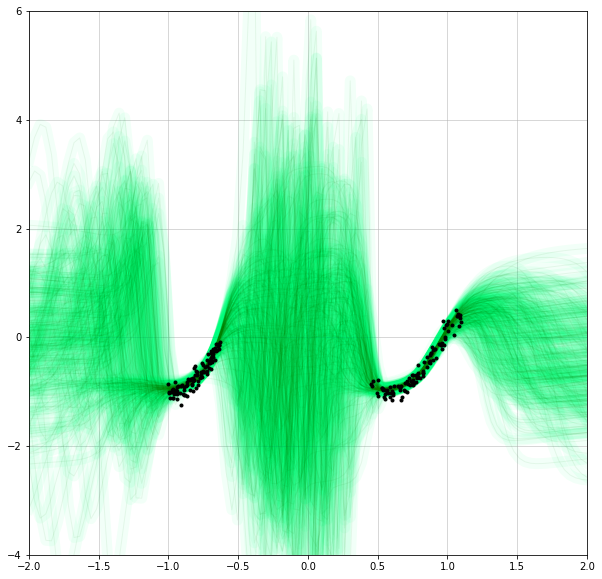

Epoch [3000/20000], Bound: 0.7591449618339539, Entropy: -106.59506225585938, Temp: 3.975830554962158, KL: 260.65521240234375, Loss: 0.007831224240362644, Learning Rate: 9.1552734375e-07
Epoch [3001/20000], Bound: 0.7588219046592712, Entropy: -114.12934875488281, Temp: 3.9758310317993164, KL: 259.33624267578125, Loss: 0.009177682921290398, Learning Rate: 9.1552734375e-07
Epoch [3002/20000], Bound: 0.7567631602287292, Entropy: -117.33753967285156, Temp: 3.9758315086364746, KL: 259.2322998046875, Loss: 0.007326892577111721, Learning Rate: 9.1552734375e-07
Epoch [3003/20000], Bound: 0.7615600228309631, Entropy: -112.29055786132812, Temp: 3.975832223892212, KL: 262.6698913574219, Loss: 0.007645045407116413, Learning Rate: 9.1552734375e-07
Epoch [3004/20000], Bound: 0.7606692910194397, Entropy: -120.84051513671875, Temp: 3.975832462310791, KL: 261.5121765136719, Loss: 0.008232654072344303, Learning Rate: 9.1552734375e-07
Epoch [3005/20000], Bound: 0.7545046806335449, Entropy: -106.6601257324

In [11]:
%matplotlib inline
from tempfile import TemporaryDirectory


C=1.
R=.5
k_MC=100

#sample, = ax.scatter([],[],color='red',alpha=0.07)
#fig.canvas.draw()
    
    
'''
def show(GeN,n,alpha=0.07):
    Z=GeN(n).detach().clone().cpu()
    plt.pcolormesh(grid_x.numpy(),grid_y.numpy(),p.exp().numpy())
    plt.scatter(Z[:,0],Z[:,1],color='red',alpha=alpha) 
    plt.draw()
    plt.show()
''' 

def show(GeN,n):
    Z=GeN(200).detach()
    fig=setup.makePlot(Z,device)
    plt.show()
    return
    
#lr =.03 for lat_dim 5

with TemporaryDirectory() as temp_dir:
    optimizer = GeNPACPred(loss, logprior, n_data_samples, C, R, projection, k_MC,
		                                    0, 100, 1000, 50, 50,
		                                    20000, .03, .000001, 100, .5,
		                                    device, True, temp_dir, save_best=True)
    best_epoch, scores=optimizer.run(GeN,show)
print(best_epoch,scores)

In [12]:
torch.sqrt(1/(R*2*scores[3]))

tensor(0.5015, device='cuda:0')

In [13]:
scores

[tensor(0.7481, device='cuda:0'),
 tensor(0.0076, device='cuda:0'),
 tensor(252.4965, device='cuda:0'),
 tensor(3.9758, device='cuda:0')]

In [14]:
torch.sqrt(1/(R*2*scores[3]))

tensor(0.5015, device='cuda:0')

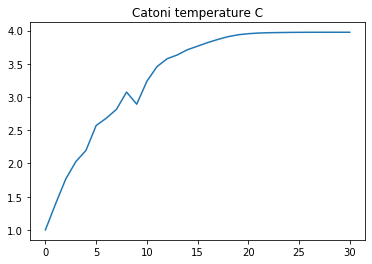

In [15]:
%matplotlib inline
y=optimizer.score_temp
time=torch.arange(0,len(y),1.)
plt.title('Catoni temperature C')
plt.plot(time, y)

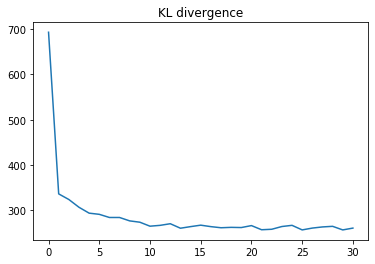

In [16]:
%matplotlib inline
y=optimizer.score_entropy
time=torch.arange(0,len(y),1.)
plt.title('KL divergence')
plt.plot(time, y)

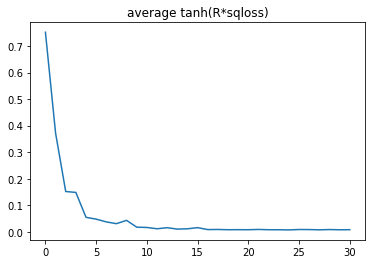

In [17]:
%matplotlib inline
y=torch.as_tensor(optimizer.score_elbo)
time=torch.arange(0,len(y),1.)
plt.title('average tanh(R*sqloss)')
plt.plot(time, y, label='tanhloss')


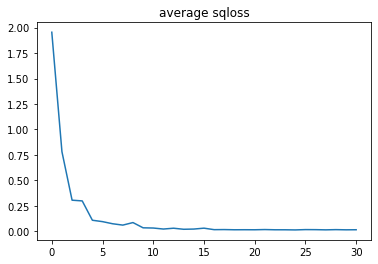

In [18]:
%matplotlib inline
y=torch.as_tensor(optimizer.score_elbo)
time=torch.arange(0,len(y),1.)
plt.title('average sqloss')
yy=(1/R)*0.5*(torch.log1p(y)-torch.log1p(-y))
plt.plot(time,yy, label='squared loss')

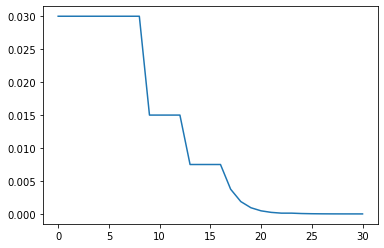

In [20]:
%matplotlib inline
y=optimizer.score_lr
time=torch.arange(0,len(y),1.)
plt.plot(time, y)


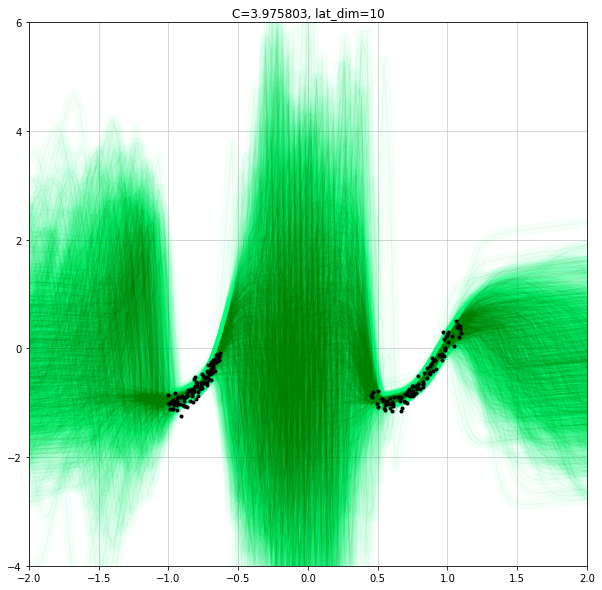

[tensor(0.7481, device='cuda:0'),
 tensor(0.0076, device='cuda:0'),
 tensor(252.4965, device='cuda:0'),
 tensor(3.9758, device='cuda:0')]

In [21]:
%matplotlib inline

def show(GeN,n):
    Z=GeN(n).detach()
    fig=setup.makePlot(Z,device)
    plt.title('C='+str(scores[-1].cpu().float().numpy())+', lat_dim='+str(lat_dim))
    plt.show()
    return
    

show(GeN,1000)
scores

In [22]:
nLPP_train, nLPP_validation, nLPP_test, RSE_train, RSE_validation, RSE_test=setup.evaluate_metrics(GeN(1000).detach(),'cpu')

In [23]:
print('nLPP_valid: '+str(nLPP_validation))
print('SE_valid: '+str(RSE_validation))
print('nLPP_test: '+str(nLPP_test))
print('SE_test: '+str(RSE_test))

nLPP_valid: (tensor(-0.8179), tensor(0.6537))
SE_valid: (tensor(0.0111), tensor(0.0153))
nLPP_test: (tensor(0.4799), tensor(1.0001))
SE_test: (tensor(0.3067), tensor(0.3855))


Pour un choix de points $x_0,...,x_{n-1}$, on définit:
$$
d(\theta,\theta')=\frac{1}{n}\sum_{i<n}\vert f_\theta(x_i)-f_{\theta'}(x_i)\vert
$$
ou
$$
d_2(\theta,\theta')=\biggl(\frac{1}{n}\sum_{i<n}\vert f_\theta(x_i)-f_{\theta'}(x_i)\vert^2\biggr)^{\frac{1}{2}}
$$


$P(f\in A)=P(\{\theta \mid f_\theta\in A\})$

$\theta \mapsto f_\theta$ (is it continuous?)

relation entre $d(\theta,\theta')$ et $d(f_\theta,f_\theta')$